<a href="https://colab.research.google.com/github/marcelohpos/PROJETO-ICD/blob/master/icd.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Instalar dependência (só precisa rodar uma vez)
!pip install geopy seaborn

In [2]:
# Importar bibliotecas
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from geopy.geocoders import Nominatim
import time
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import scipy.stats as st

In [3]:
!pip install calmap

In [4]:
!pip install calplot

In [5]:
# Carregar os dados
url1 = "https://raw.githubusercontent.com/marcelohpos/PROJETO-ICD/master/datasets/LA_daily_air_quality.csv"
dados_clima = pd.read_csv(url1)

url2 = "https://raw.githubusercontent.com/marcelohpos/PROJETO-ICD/master/datasets/LA_daily_climate.csv"
dados_temp = pd.read_csv(url2)

In [6]:
dados_clima.columns = ['Data', 'Latitude', 'Longitude', 'PM10', 'PM2_5', 'Monóxido de Carbono (CO)', 'Dióxido de Nitrogênio (NO2)', 'Dioxido de Enxofre(SO2)', 'Ozônio(O3)']

dados_temp.columns = ['País','Cidade','Data','Latitude','Longitude','Temperatura_2m_max','Temperatura_2m_min','Temperatura_2m_media','Temperatura_aparente_max','Temperatura_aparente_min','Temperatura_aparente_media','Soma_precipitacao','Velocidade_vento_10m_max','Et0_fao_evapotranspiração']

##**Análises Gerais:**

In [7]:
dados_clima

,Data,Latitude,Longitude,PM10,PM2_5,Monóxido de Carbono (CO),Dióxido de Nitrogênio (NO2),Dioxido de Enxofre(SO2),Ozônio(O3)
0,2022-07-29 00:00:00+00:00,-34.6037,-58.3816,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-07-30 00:00:00+00:00,-34.6037,-58.3816,NaN,NaN,NaN,NaN,NaN,NaN
2,2022-07-31 00:00:00+00:00,-34.6037,-58.3816,NaN,NaN,NaN,NaN,NaN,NaN
3,2022-08-01 00:00:00+00:00,-34.6037,-58.3816,NaN,NaN,NaN,NaN,NaN,NaN
4,2022-08-02 00:00:00+00:00,-34.6037,-58.3816,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
12635,2024-04-16 00:00:00+00:00,10.4806,-66.9036,9.3,6.1,232.0,7.3,2.1,41.0
12636,2024-04-17 00:00:00+00:00,10.4806,-66.9036,28.5,19.6,510.0,18.5,3.4,36.0
12637,2024-04-18 00:00:00+00:00,10.4806,-66.9036,23.1,16.2,446.0,14.2,3.2,58.0
12638,2024-04-19 00:00:00+00:00,10.4806,-66.9036,40.7,29.1,775.0,26.5,5.6,49.0


In [8]:
# Garante que a coluna 'Data' está no formato datetime
dados_clima['Data'] = pd.to_datetime(dados_clima['Data'], errors='coerce')

# Remove linhas sem data válida
dados_validos = dados_clima.dropna(subset=['Data'])

# Extrai o ano e mostra os anos únicos e quantos são
anos_unicos = dados_validos['Data'].dt.year.unique()
quantos_anos = len(anos_unicos)

print(f"Anos presentes: {sorted(anos_unicos)}")
print(f"Quantidade de anos distintos: {quantos_anos}")

Anos presentes: [np.int32(2022), np.int32(2023), np.int32(2024)]
Quantidade de anos distintos: 3


/tmp/ipython-input-3464166919.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


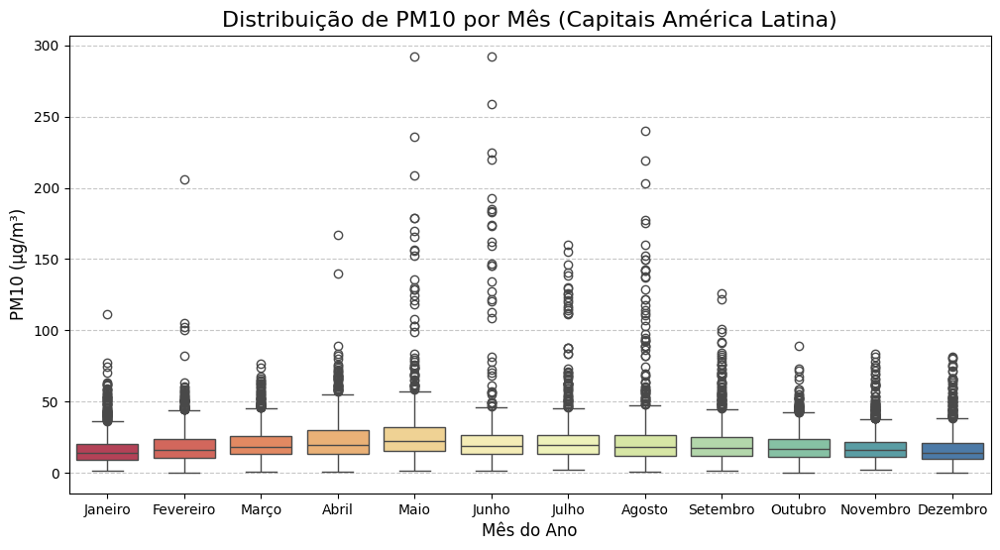

/tmp/ipython-input-3464166919.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


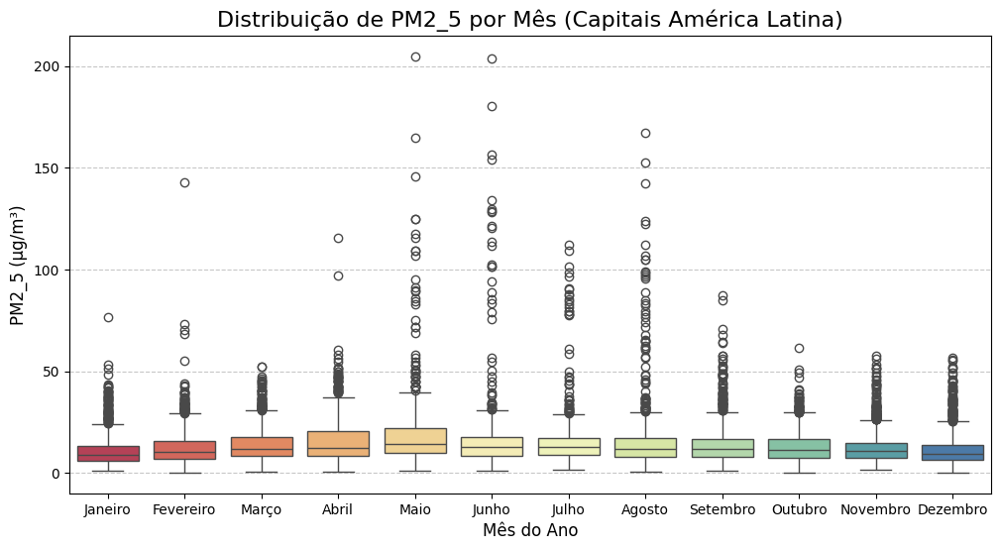

/tmp/ipython-input-3464166919.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


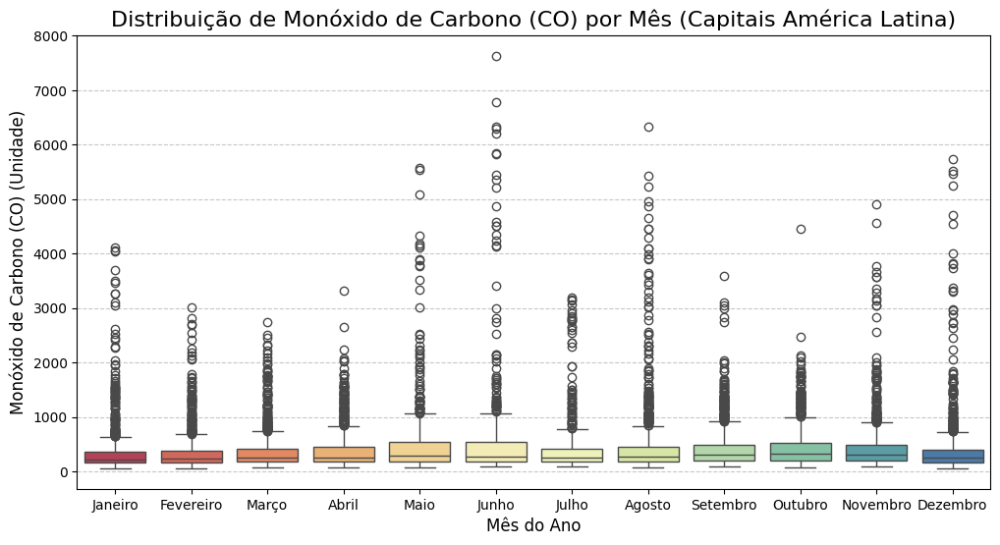

/tmp/ipython-input-3464166919.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


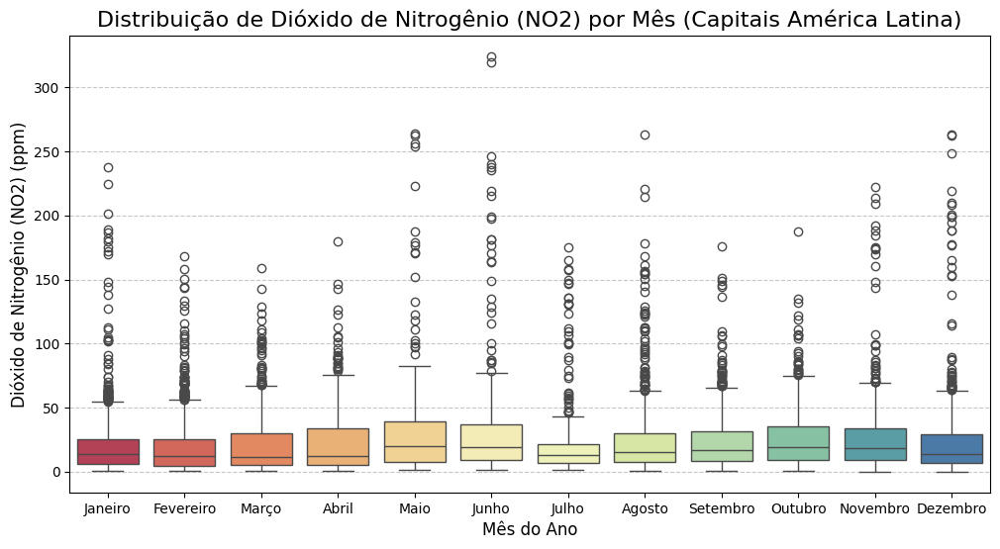

/tmp/ipython-input-3464166919.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


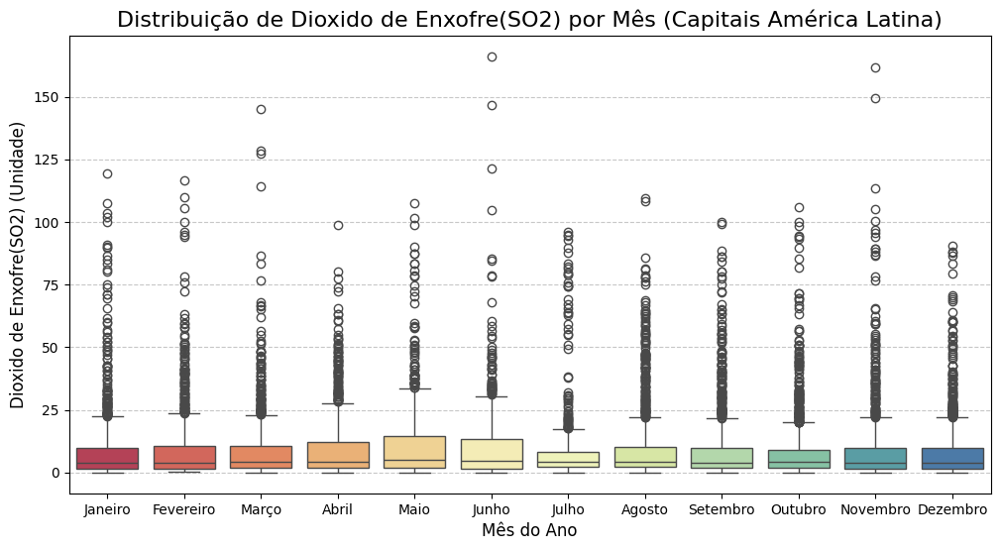

/tmp/ipython-input-3464166919.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


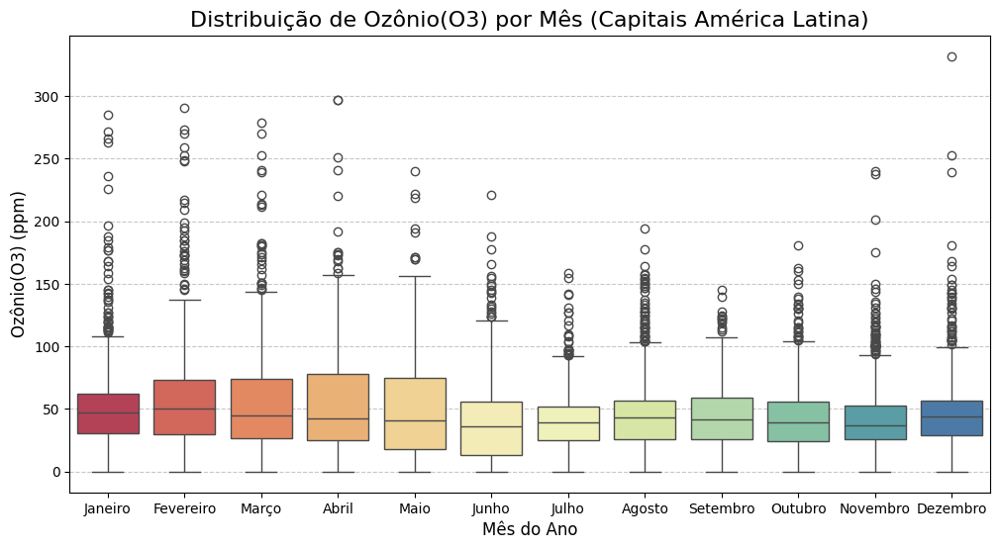

In [9]:
# --- 0. PRÉ-PROCESSAMENTO DE DADOS (Manter a extração de data) ---

# 1. Garantir que a coluna 'Data' seja do tipo datetime
dados_clima['Data'] = pd.to_datetime(dados_clima['Data'], errors='coerce')
# Não filtramos o PM10 ainda, pois faremos isso dinamicamente no loop
df_sazonal = dados_clima.dropna(subset=['Data']).copy()

# 2. DEFINIÇÃO DOS DICIONÁRIOS DE TRADUÇÃO
traducao_meses = {
    1: 'Janeiro', 2: 'Fevereiro', 3: 'Março', 4: 'Abril', 5: 'Maio', 6: 'Junho',
    7: 'Julho', 8: 'Agosto', 9: 'Setembro', 10: 'Outubro', 11: 'Novembro', 12: 'Dezembro'
}
# Extração das colunas em Português
df_sazonal['Mês_Nome'] = df_sazonal['Data'].dt.month.map(traducao_meses)
ordem_meses_pt = list(traducao_meses.values())

# 3. IDENTIFICAÇÃO DOS INDICADORES
# Lista de colunas que representam indicadores de poluição na sua base
indicadores_poluicao = ['PM10', 'PM2_5', 'Monóxido de Carbono (CO)', 'Dióxido de Nitrogênio (NO2)', 'Dioxido de Enxofre(SO2)', 'Ozônio(O3)']

# Mapeamento de unidade e título (para o gráfico ficar mais limpo)
unidades = {
    'PM10': 'μg/m³',
    'PM2_5': 'μg/m³',
    'Ozônio(O3)': 'ppm',
    'Dióxido de Nitrogênio (NO2)': 'ppm',
    'Monóxido de Carbono (CO2)': 'ppm',
    'Dióxido de Enxofre(SO2)':'ppm'
}

# --- 4. FUNÇÃO PARA GERAR O GRÁFICO POR INDICADOR ---

def plot_sazonal_por_indicador(df, indicador, ordem_eixo, unidade):
    # Remove NaN apenas para a coluna do indicador atual
    df_plot = df.dropna(subset=[indicador, 'Mês_Nome'])

    if df_plot.empty:
        print(f"Aviso: Não há dados válidos para o indicador {indicador}.")
        return

    plt.figure(figsize=(12, 6))

    sns.boxplot(
        data=df_plot,
        x='Mês_Nome',
        y=indicador,
        order=ordem_eixo,
        palette='Spectral'
    )

    # Cria o título e rótulo dinamicamente
    titulo = f'Distribuição de {indicador} por Mês (Capitais América Latina)'
    eixo_y = f'{indicador} ({unidade.get(indicador, "Unidade")})'

    plt.title(titulo, fontsize=16)
    plt.xlabel('Mês do Ano', fontsize=12)
    plt.ylabel(eixo_y, fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


# --- 5. EXECUÇÃO DO LOOP ---

for indicador in indicadores_poluicao:
    # Obtém a unidade do indicador atual ou usa um valor padrão
    unidade_atual = unidades.get(indicador, 'Unidade')

    # Chama a função para gerar o gráfico Box Plot do Mês
    plot_sazonal_por_indicador(df_sazonal, indicador, ordem_meses_pt, unidades)

In [10]:
df_sazonal

,Data,Latitude,Longitude,PM10,PM2_5,Monóxido de Carbono (CO),Dióxido de Nitrogênio (NO2),Dioxido de Enxofre(SO2),Ozônio(O3),Mês_Nome
0,2022-07-29 00:00:00+00:00,-34.6037,-58.3816,NaN,NaN,NaN,NaN,NaN,NaN,Julho
1,2022-07-30 00:00:00+00:00,-34.6037,-58.3816,NaN,NaN,NaN,NaN,NaN,NaN,Julho
2,2022-07-31 00:00:00+00:00,-34.6037,-58.3816,NaN,NaN,NaN,NaN,NaN,NaN,Julho
3,2022-08-01 00:00:00+00:00,-34.6037,-58.3816,NaN,NaN,NaN,NaN,NaN,NaN,Agosto
4,2022-08-02 00:00:00+00:00,-34.6037,-58.3816,NaN,NaN,NaN,NaN,NaN,NaN,Agosto
...,...,...,...,...,...,...,...,...,...,...
12635,2024-04-16 00:00:00+00:00,10.4806,-66.9036,9.3,6.1,232.0,7.3,2.1,41.0,Abril
12636,2024-04-17 00:00:00+00:00,10.4806,-66.9036,28.5,19.6,510.0,18.5,3.4,36.0,Abril
12637,2024-04-18 00:00:00+00:00,10.4806,-66.9036,23.1,16.2,446.0,14.2,3.2,58.0,Abril
12638,2024-04-19 00:00:00+00:00,10.4806,-66.9036,40.7,29.1,775.0,26.5,5.6,49.0,Abril


1- Como a qualidade do ar em Brasília se compara com a das capitais de outros países como Chile, Colômbia ou Argentina?

In [11]:
# Obter coordenadas únicas
coordenadas_unicas = dados_clima[['Latitude', 'Longitude']].drop_duplicates().reset_index(drop=True)

# Usar a API Nominatim (OpenStreetMap)
geolocator = Nominatim(user_agent="qualidade_ar_analise")
nomes = []

print("🔎 Consultando cidades... (pode demorar um pouco)")
for i, row in coordenadas_unicas.iterrows():
    try:
        location = geolocator.reverse((row['Latitude'], row['Longitude']), language='pt')
        if location and 'address' in location.raw:
            cidade = (location.raw['address'].get('city') or
                      location.raw['address'].get('town') or
                      location.raw['address'].get('state') or
                      "Desconhecida")
        else:
            cidade = "Desconhecida"
        nomes.append(cidade)
        print(f"→ {row['Latitude']}, {row['Longitude']} → {cidade}")
    except Exception as e:
        print(f"⚠️ Erro em {i}: {e}")
        nomes.append("Erro")
    time.sleep(1)  # evita bloqueio de requisições pela API

coordenadas_unicas["Cidade"] = nomes

# Juntar as cidades ao DataFrame original
dados_clima = dados_clima.merge(coordenadas_unicas, on=["Latitude", "Longitude"], how="left")

# Converter o DataFrame para formato longo (ideal para gráficos)
dados_longos = dados_clima.melt(
    id_vars=["Cidade"],
    value_vars=['PM10', 'PM2_5', 'Monóxido de Carbono (CO)', 'Dióxido de Nitrogênio (NO2)', 'Dioxido de Enxofre(SO2)', 'Ozônio(O3)'],
    var_name="Indicador",
    value_name="Valor"
)

🔎 Consultando cidades... (pode demorar um pouco)
→ -34.6037, -58.3816 → Buenos Aires
→ -19.0196, -65.2619 → Sucre
→ -15.8267, -47.9218 → Brasília
→ -33.4378, -70.6504 → Região Metropolitana de Santiago
→ 4.711, -74.0721 → Bogotá
→ 9.9281, -84.0907 → San José
→ 23.1136, -82.3666 → La Habana
→ 18.4861, -69.9312 → São Domingos
→ -0.1807, -78.4678 → Quito
→ 13.6929, -89.2182 → São Salvador
→ 14.6349, -90.5069 → Cidade da Guatemala
→ 18.5944, -72.3074 → Porto Príncipe
→ 14.0723, -87.1921 → Tegucigalpa
→ 19.4326, -99.1332 → Cidade do México
→ 12.114, -86.2362 → Manágua
→ 8.9824, -79.5199 → Bella Vista
→ -25.2637, -57.5759 → Assunção
→ -12.0464, -77.0428 → Lima
→ -34.9011, -56.1645 → Montevidéu
→ 10.4806, -66.9036 → Caracas


✅ Indicadores prontos para histogramas: ['PM10', 'PM2_5', 'Monóxido de Carbono (CO)', 'Dióxido de Nitrogênio (NO2)', 'Dioxido de Enxofre(SO2)', 'Ozônio(O3)']


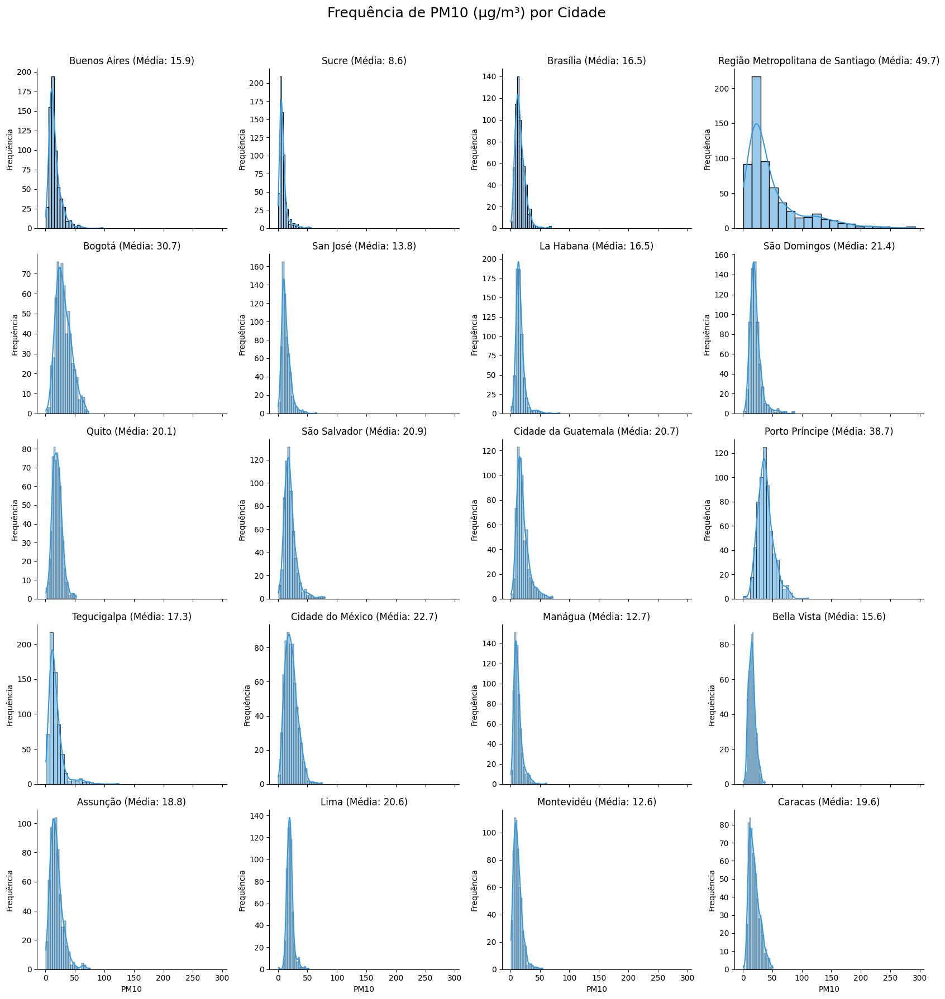

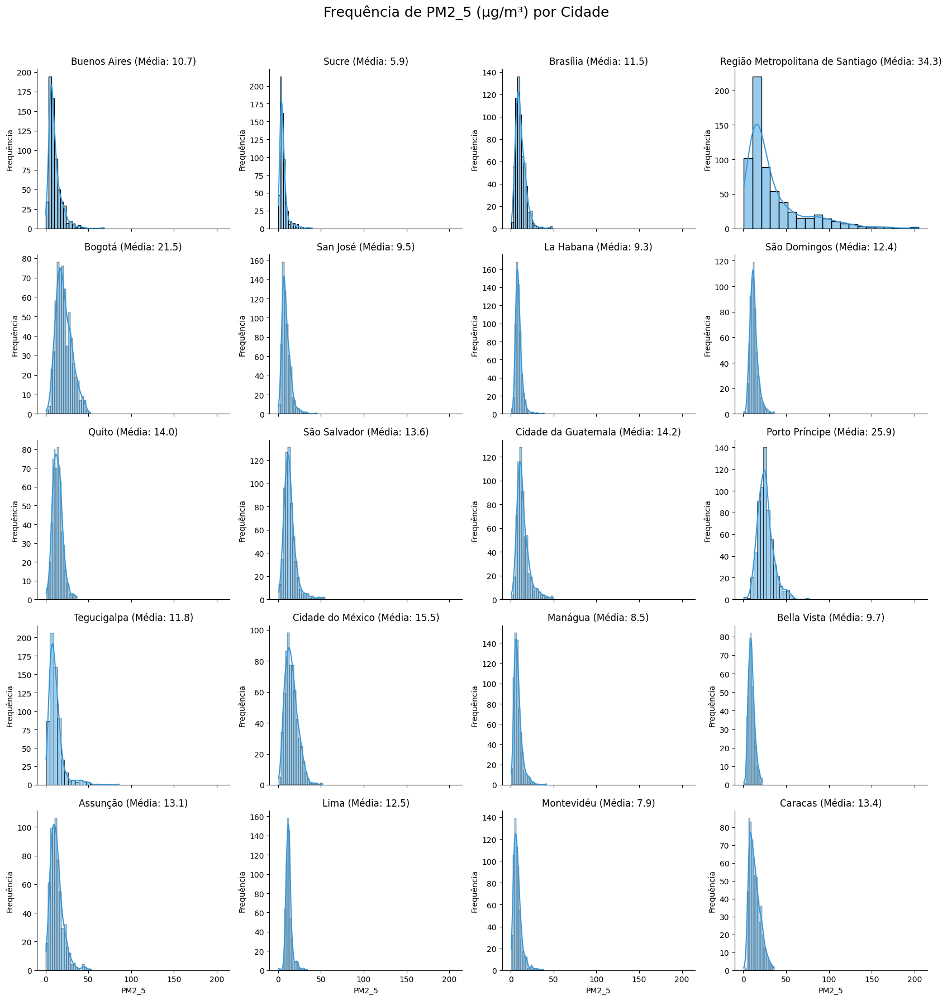

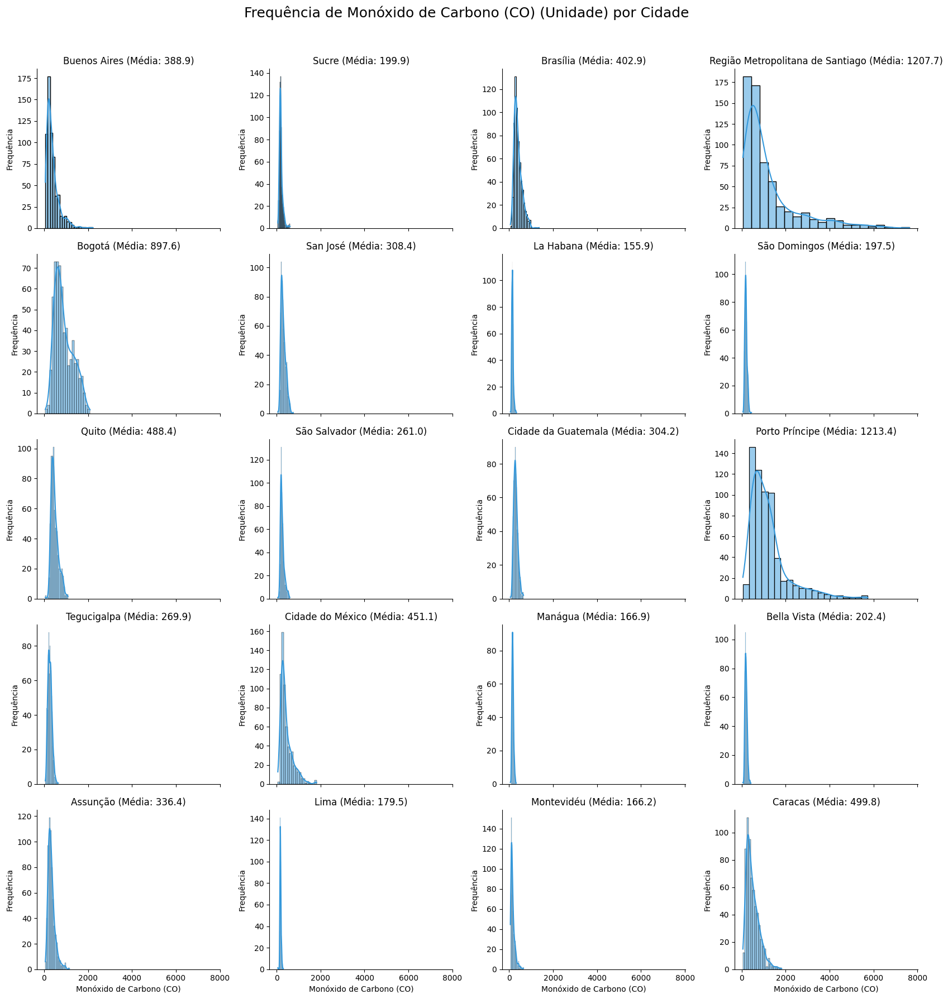

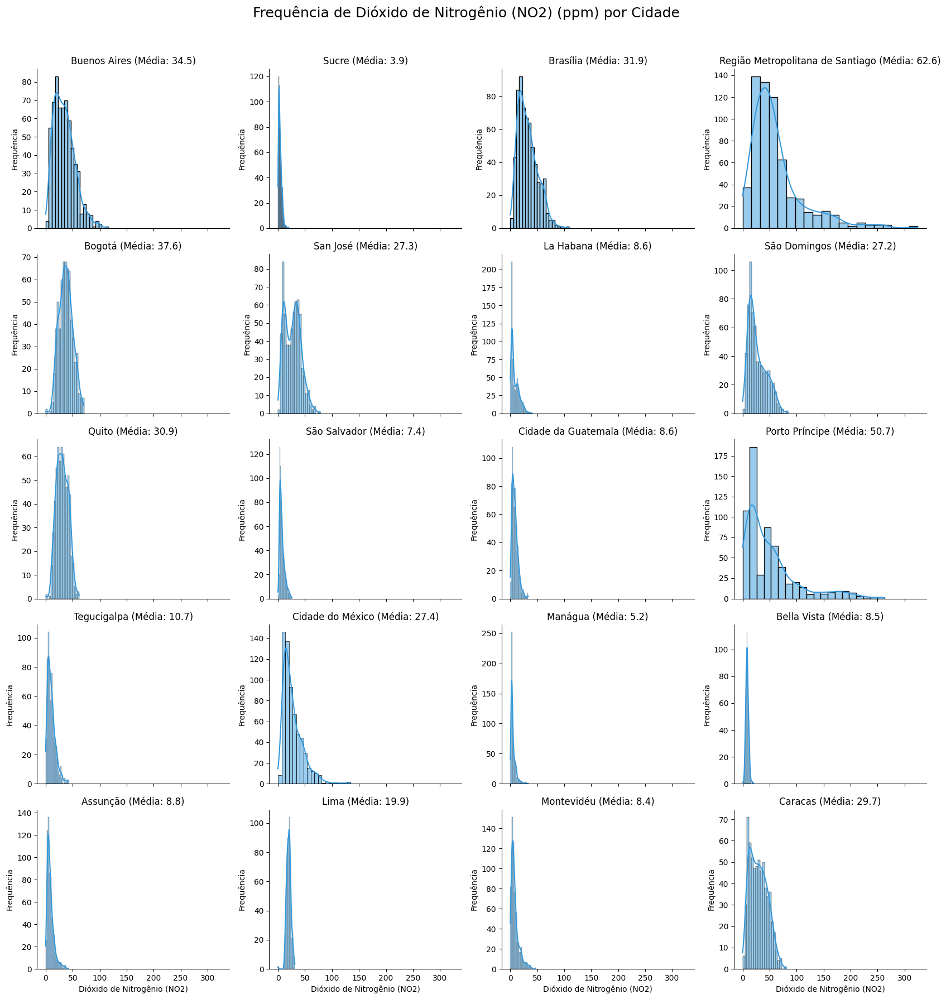

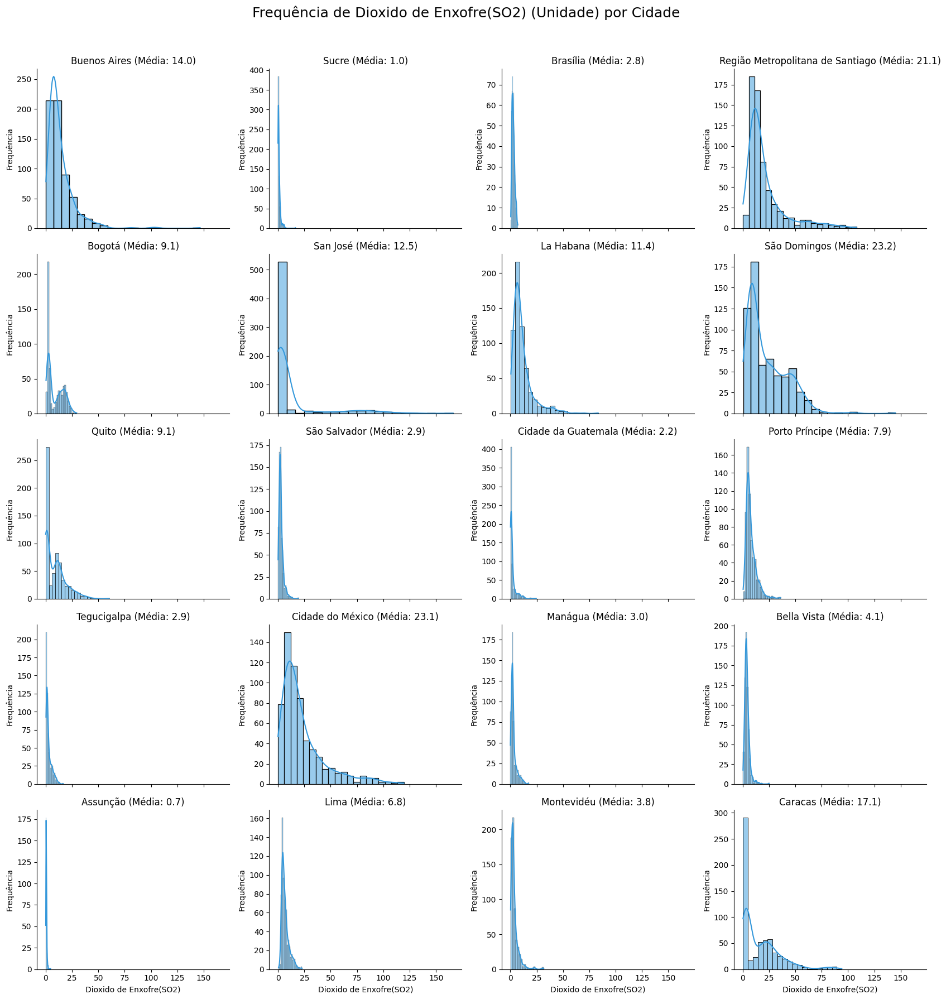

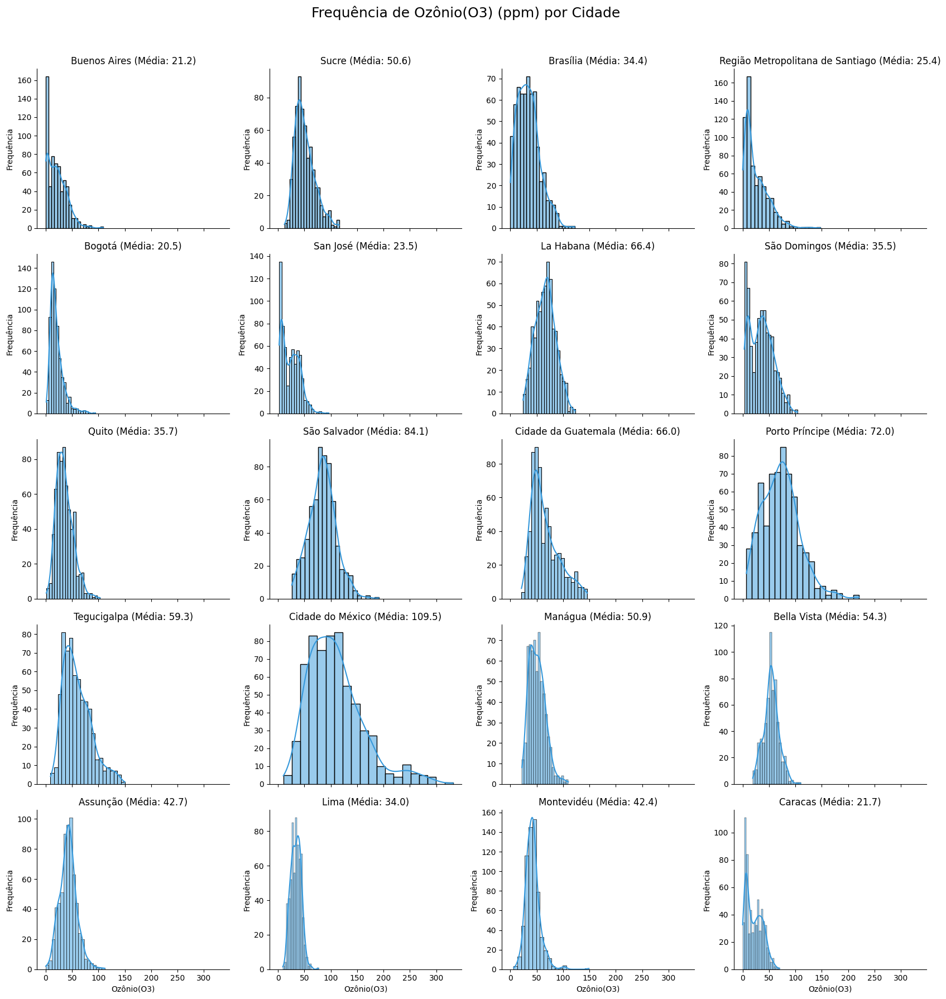

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- 0. PREPARAÇÃO DE DADOS ---

# 1. Garantir que a coluna 'Data' seja do tipo datetime (necessário para a próxima fase de EDA, mas mantemos)
dados_clima['Data'] = pd.to_datetime(dados_clima['Data'], errors='coerce')
df_plot = dados_clima.dropna(subset=['Cidade']).copy()

# 2. IDENTIFICAÇÃO DOS INDICADORES (Ajuste esta lista conforme seu DataFrame)
indicadores_candidatos = ['PM10', 'PM2_5', 'Monóxido de Carbono (CO)', 'Dióxido de Nitrogênio (NO2)', 'Dioxido de Enxofre(SO2)', 'Ozônio(O3)']
colunas_disponiveis = df_plot.columns.tolist()
indicadores_poluicao = [ind for ind in indicadores_candidatos if ind in colunas_disponiveis]

# Mapeamento de unidade e título (para o gráfico ficar mais limpo)
unidades = {
    'PM10': 'μg/m³',
    'PM2_5': 'μg/m³',
    'Ozônio(O3)': 'ppm',
    'Dióxido de Nitrogênio (NO2)': 'ppm',
    'Monóxido de Carbono (CO2)': 'ppm',
    'Dióxido de Enxofre(SO2)':'ppm'
}

print(f"✅ Indicadores prontos para histogramas: {indicadores_poluicao}")

# --- 3. FUNÇÃO PARA GERAR O HISTOGRAMA COM FACETAMENTO POR CIDADE ---

def plot_histogramas_facetados(df, indicador, unidade):

    # Remove NaN apenas para o indicador atual e a cidade
    df_indicador = df.dropna(subset=[indicador, 'Cidade'])

    if df_indicador.empty:
        print(f"Aviso: Não há dados válidos para o indicador {indicador}. Gráfico ignorado.")
        return

    # Define o número de cidades e o tamanho do grid
    n_cidades = df_indicador['Cidade'].nunique()
    # Ajuste o tamanho da figura para acomodar o número de cidades (ex: 2 linhas, N/2 colunas)
    cols = min(4, n_cidades) # Máximo de 4 colunas
    rows = int(np.ceil(n_cidades / cols))

    # O FacetGrid é ideal para criar painéis de subplots baseados em uma categoria (Cidade)
    g = sns.FacetGrid(
        df_indicador,
        col="Cidade",
        col_wrap=cols, # Número de colunas no grid
        sharey=False,  # Permite que o eixo Y seja diferente para cada cidade (melhor para distribuição)
        height=3.5,
        aspect=1.2 # Aspecto mais largo
    )

    # Mapeia a função de histograma para cada painel
    g.map(
        sns.histplot,
        indicador,
        kde=True, # Adiciona a curva de densidade (suaviza a distribuição)
        bins=20,  # Número de caixas/intervalos
        color="#3498db" # Cor de fundo
    )

    # Adiciona títulos e ajusta layout
    titulo_principal = f'Frequência de {indicador} ({unidade.get(indicador, "Unidade")}) por Cidade'
    g.fig.suptitle(titulo_principal, fontsize=18, y=1.02)

    # Ajusta os rótulos de cada subplot (opcional)
    for ax in g.axes.flat:
        ax.set_xlabel(indicador, fontsize=10)
        ax.set_ylabel("Frequência", fontsize=10)
        # Adiciona a média no título do subplot para referência
        media = df_indicador.loc[df_indicador['Cidade'] == ax.get_title().split('=')[1].strip(), indicador].mean()
        ax.set_title(f"{ax.get_title().split('=')[1].strip()} (Média: {media:.1f})")

    plt.tight_layout() # Garante que os títulos e rótulos não se sobreponham
    plt.show()


# --- 4. EXECUÇÃO DO LOOP ---

for indicador in indicadores_poluicao:
    plot_histogramas_facetados(df_plot, indicador, unidades)

2- Gráficos de violino no que diz respeito a cada indicador de ar considerando cada capital

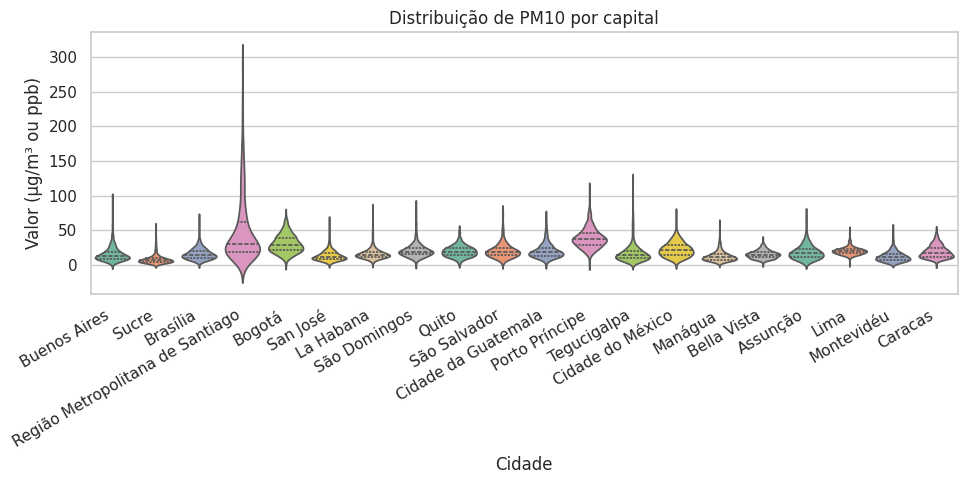

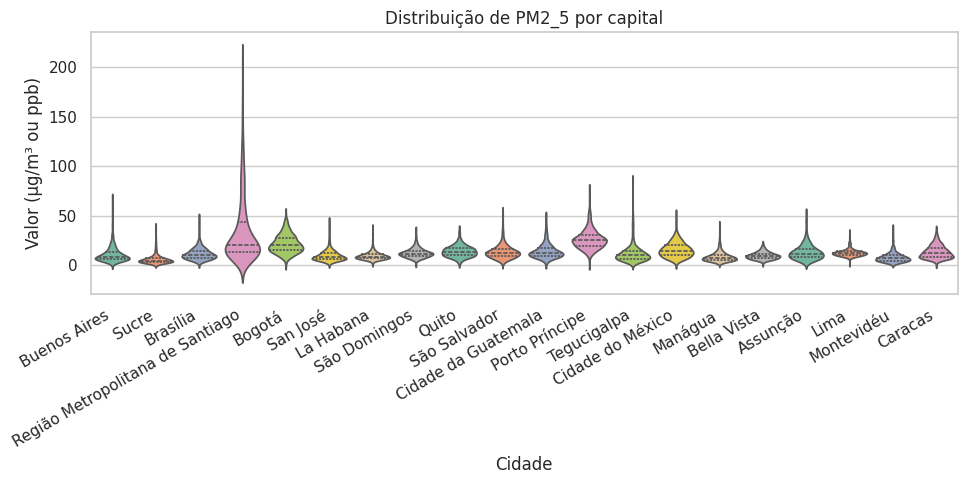

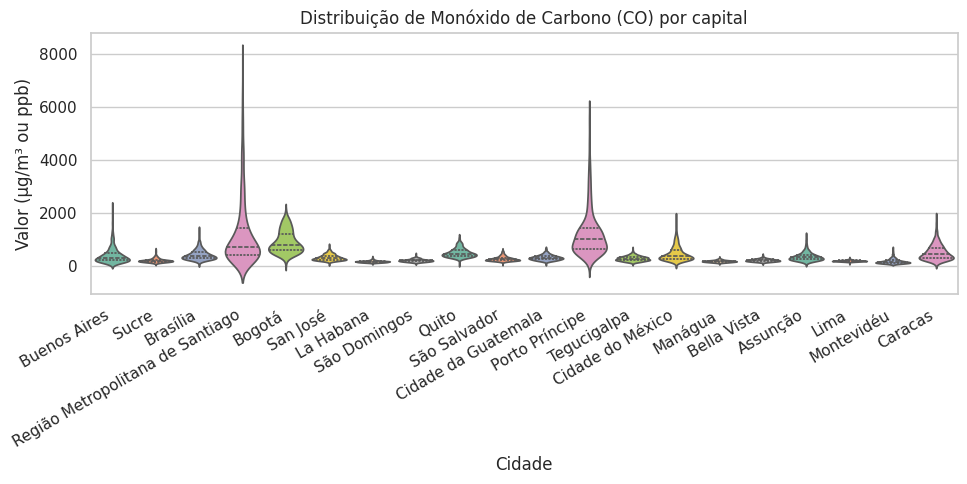

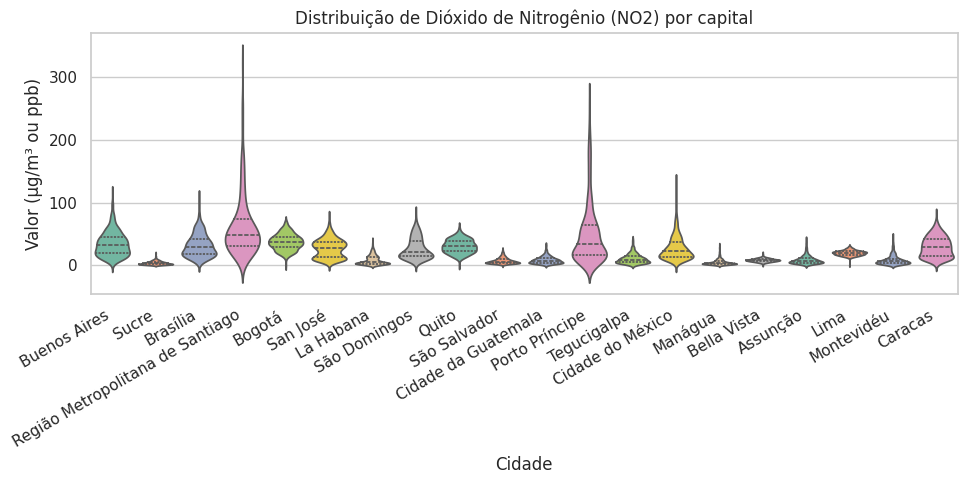

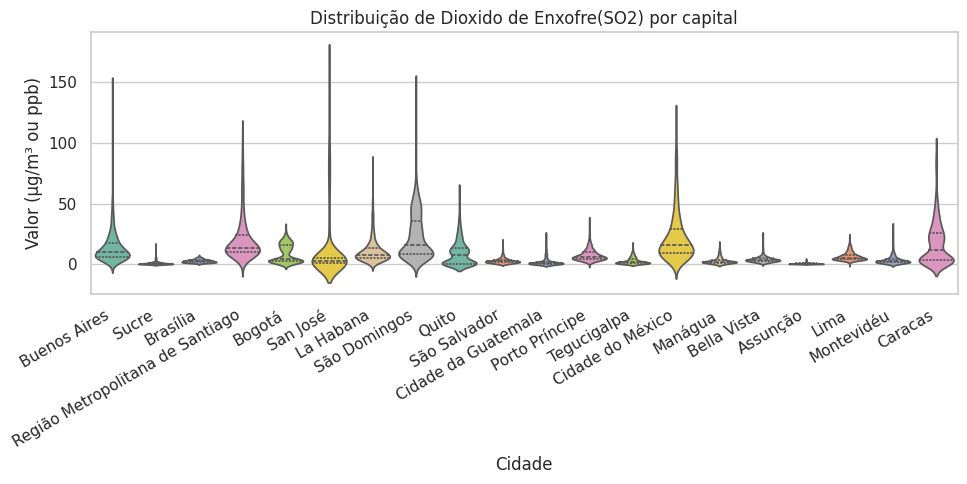

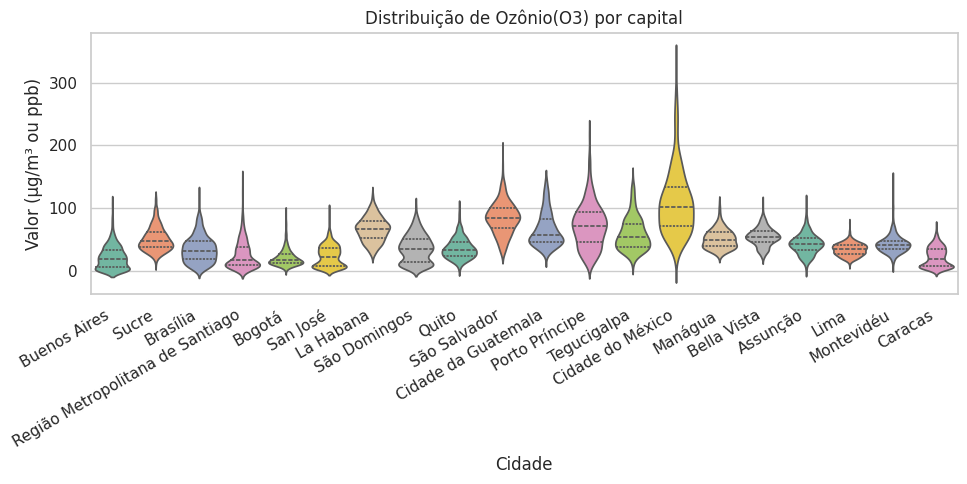

In [13]:
# Garantir que só existam linhas válidas
dados_longos = dados_longos.dropna(subset=["Valor", "Cidade"])

# Configurações de estilo
sns.set(style="whitegrid")

# Gerar um gráfico separado para cada indicador
indicadores = dados_longos["Indicador"].unique()

for indicador in indicadores:
    plt.figure(figsize=(10, 5))

    sns.violinplot(
        data=dados_longos[dados_longos["Indicador"] == indicador],
        x="Cidade", y="Valor",
        hue="Cidade",      # cores diferentes por cidade
        inner="quartile",
        palette="Set2",
        dodge=False        # mantém violinos sobrepostos ou separados
    )




    plt.title(f"Distribuição de {indicador} por capital")
    plt.xlabel("Cidade")
    plt.ylabel("Valor (μg/m³ ou ppb)")
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    plt.show()

3- fazer um calendário de heatmap pros niveis de ar e olhar se tem alguma sazonalidade de brasilia ou geral de tudo

In [14]:
#Calendar Heatmap agrupado (média dos anos de 2022, 2023 e 2024) da concentração de gases nas capitais da América Latina, exceto Brasília
import pandas as pd
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode

# Inicializa o modo offline
init_notebook_mode(connected=True)

# DICIONÁRIO DE UNIDADES
unidades = {
    'PM10': 'μg/m³',
    'PM2_5': 'μg/m³',
    'Ozônio(O3)': 'ppm',
    'Dióxido de Nitrogênio (NO2)': 'ppm',
    'Monóxido de Carbono (CO)': 'ppm',
    'Dioxido de Enxofre(SO2)':'ppm'
}

# LISTA DE INDICADORES
indicadores_poluicao = ['PM10', 'PM2_5', 'Monóxido de Carbono (CO)',
                        'Dióxido de Nitrogênio (NO2)', 'Dioxido de Enxofre(SO2)',
                        'Ozônio(O3)']

# ORDENS DE EXIBIÇÃO
ordem_meses_pt = ['Janeiro', 'Fevereiro', 'Março', 'Abril', 'Maio', 'Junho',
                  'Julho', 'Agosto', 'Setembro', 'Outubro', 'Novembro', 'Dezembro']
ordem_dias_pt = ['Segunda-feira', 'Terça-feira', 'Quarta-feira',
                 'Quinta-feira', 'Sexta-feira', 'Sábado', 'Domingo']

traducao_meses = {
    1: 'Janeiro', 2: 'Fevereiro', 3: 'Março', 4: 'Abril', 5: 'Maio', 6: 'Junho',
    7: 'Julho', 8: 'Agosto', 9: 'Setembro', 10: 'Outubro', 11: 'Novembro', 12: 'Dezembro'
}

dados_clima['Mês_Nome'] = dados_clima['Data'].dt.month.map(traducao_meses)

# Dicionário para traduzir o número do dia da semana (0=Segunda, 6=Domingo)
traducao_dias = {
    0: 'Segunda-feira', 1: 'Terça-feira', 2: 'Quarta-feira',
    3: 'Quinta-feira', 4: 'Sexta-feira', 5: 'Sábado', 6: 'Domingo'
}

dados_clima['Dia_Semana_Nome'] = dados_clima['Data'].dt.dayofweek.map(traducao_dias)

# ----------------------------------------------------------------------
# LOOP PARA GERAR O CALENDÁRIO HEATMAP PARA CADA INDICADOR
# ----------------------------------------------------------------------

for indicador in indicadores_poluicao:
    # 1. TRATAMENTO DE DADOS E AGREGAÇÃO
    # Tenta obter a unidade, se não encontrar, usa uma string vazia
    unidade = unidades.get(indicador, '')

    # Agrupamento: Média do indicador por Mês e Dia da Semana
    df_heatmap = dados_clima.groupby(['Mês_Nome', 'Dia_Semana_Nome'])[indicador].mean().reset_index()

    # 2. PIVOTAGEM DOS DADOS
    # Transforma a tabela longa (long format) em matriz (matrix format)
    df_pivot = df_heatmap.pivot(index='Mês_Nome', columns='Dia_Semana_Nome', values=indicador)

    # 3. REORDENAR A TABELA PIVOTADA
    # Garante a ordem correta dos meses (índice) e dias (colunas)
    df_pivot = df_pivot.reindex(index=ordem_meses_pt, columns=ordem_dias_pt)

    # Verifica se há dados válidos para plotar
    if df_pivot.empty or df_pivot.isnull().all().all():
        print(f"Aviso: Não há dados suficientes ou válidos para o indicador '{indicador}'. Pulando.")
        continue

    # 4. CRIAÇÃO DO HEATMAP COM PLOTLY GRAPH OBJECTS
    fig = go.Figure(data=go.Heatmap(
            # Eixos
            x=df_pivot.columns,
            y=df_pivot.index,
            # Valores
            z=df_pivot.values,
            # Configuração de cor e barra de cor
            colorscale='plasma', # Você pode mudar o esquema de cor (ex: 'viridis', 'hot')
            colorbar=dict(title=f'{indicador} ({unidade})'),
            # Configuração de texto (média na célula)
            text=df_pivot.values.round(2),
            texttemplate="%{text}",
            # Configuração de informações ao passar o mouse (hover)
            hovertemplate=f'<b>Mês:</b> %{{y}}<br><b>Dia:</b> %{{x}}<br><b>Média:</b> %{{z:.2f}} {unidade}<extra></extra>'
    ))

    # 5. AJUSTES FINAIS DE LAYOUT
    fig.update_layout(
        title=f'Sazonalidade da Média de {indicador} ({unidade})<br>Por Mês e Dia da Semana',
        xaxis_title='Dia da Semana',
        yaxis_title='Mês',
        # Inverte o eixo Y para que Janeiro fique no topo e Dezembro na base
        yaxis={'categoryorder':'array', 'categoryarray':ordem_meses_pt, 'autorange':'reversed'}
    )

    # Exibe o gráfico atual
    fig.show()

In [15]:
#Calendar Heatmap agrupado (média dos anos de 2022, 2023 e 2024) da concentração de gases em Brasília
import pandas as pd
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode

# Inicializa o modo offline
init_notebook_mode(connected=True)

# DICIONÁRIO DE UNIDADES
unidades = {
    'PM10': 'μg/m³',
    'PM2_5': 'μg/m³',
    'Ozônio(O3)': 'ppm',
    'Dióxido de Nitrogênio (NO2)': 'ppm',
    'Monóxido de Carbono (CO2)': 'ppm',
    'Dioxido de Enxofre(SO2)':'ppm'
}

# LISTA DE INDICADORES
indicadores_poluicao = ['PM10', 'PM2_5', 'Monóxido de Carbono (CO)',
                        'Dióxido de Nitrogênio (NO2)', 'Dioxido de Enxofre(SO2)',
                        'Ozônio(O3)']

# ORDENS DE EXIBIÇÃO
ordem_meses_pt = ['Janeiro', 'Fevereiro', 'Março', 'Abril', 'Maio', 'Junho',
                  'Julho', 'Agosto', 'Setembro', 'Outubro', 'Novembro', 'Dezembro']
ordem_dias_pt = ['Segunda-feira', 'Terça-feira', 'Quarta-feira',
                 'Quinta-feira', 'Sexta-feira', 'Sábado', 'Domingo']

traducao_meses = {
    1: 'Janeiro', 2: 'Fevereiro', 3: 'Março', 4: 'Abril', 5: 'Maio', 6: 'Junho',
    7: 'Julho', 8: 'Agosto', 9: 'Setembro', 10: 'Outubro', 11: 'Novembro', 12: 'Dezembro'
}

dados_clima['Mês_Nome'] = dados_clima['Data'].dt.month.map(traducao_meses)

# Dicionário para traduzir o número do dia da semana (0=Segunda, 6=Domingo)
traducao_dias = {
    0: 'Segunda-feira', 1: 'Terça-feira', 2: 'Quarta-feira',
    3: 'Quinta-feira', 4: 'Sexta-feira', 5: 'Sábado', 6: 'Domingo'
}

dados_clima['Dia_Semana_Nome'] = dados_clima['Data'].dt.dayofweek.map(traducao_dias)
df_plot=dados_clima[dados_clima['Cidade']=='Brasília']

# ----------------------------------------------------------------------
# LOOP PARA GERAR O CALENDÁRIO HEATMAP PARA CADA INDICADOR
# ----------------------------------------------------------------------

for indicador in indicadores_poluicao:
    # 1. TRATAMENTO DE DADOS E AGREGAÇÃO
    # Tenta obter a unidade, se não encontrar, usa uma string vazia
    unidade = unidades.get(indicador, '')

    # Agrupamento: Média do indicador por Mês e Dia da Semana
    df_heatmap = df_plot.groupby(['Mês_Nome', 'Dia_Semana_Nome'])[indicador].mean().reset_index()

    # 2. PIVOTAGEM DOS DADOS
    # Transforma a tabela longa (long format) em matriz (matrix format)
    df_pivot = df_heatmap.pivot(index='Mês_Nome', columns='Dia_Semana_Nome', values=indicador)

    # 3. REORDENAR A TABELA PIVOTADA
    # Garante a ordem correta dos meses (índice) e dias (colunas)
    df_pivot = df_pivot.reindex(index=ordem_meses_pt, columns=ordem_dias_pt)

    # Verifica se há dados válidos para plotar
    if df_pivot.empty or df_pivot.isnull().all().all():
        print(f"Aviso: Não há dados suficientes ou válidos para o indicador '{indicador}'. Pulando.")
        continue

    # 4. CRIAÇÃO DO HEATMAP COM PLOTLY GRAPH OBJECTS
    fig = go.Figure(data=go.Heatmap(
            # Eixos
            x=df_pivot.columns,
            y=df_pivot.index,
            # Valores
            z=df_pivot.values,
            # Configuração de cor e barra de cor
            colorscale='plasma', # Você pode mudar o esquema de cor (ex: 'viridis', 'hot')
            colorbar=dict(title=f'{indicador} ({unidade})'),
            # Configuração de texto (média na célula)
            text=df_pivot.values.round(2),
            texttemplate="%{text}",
            # Configuração de informações ao passar o mouse (hover)
            hovertemplate=f'<b>Mês:</b> %{{y}}<br><b>Dia:</b> %{{x}}<br><b>Média:</b> %{{z:.2f}} {unidade}<extra></extra>'
    ))

    # 5. AJUSTES FINAIS DE LAYOUT
    fig.update_layout(
        title=f'Sazonalidade da Média de {indicador} ({unidade})<br>Por Mês e Dia da Semana em Brasília',
        xaxis_title='Dia da Semana',
        yaxis_title='Mês',
        # Inverte o eixo Y para que Janeiro fique no topo e Dezembro na base
        yaxis={'categoryorder':'array', 'categoryarray':ordem_meses_pt, 'autorange':'reversed'}
    )

    # Exibe o gráfico atual
    fig.show()

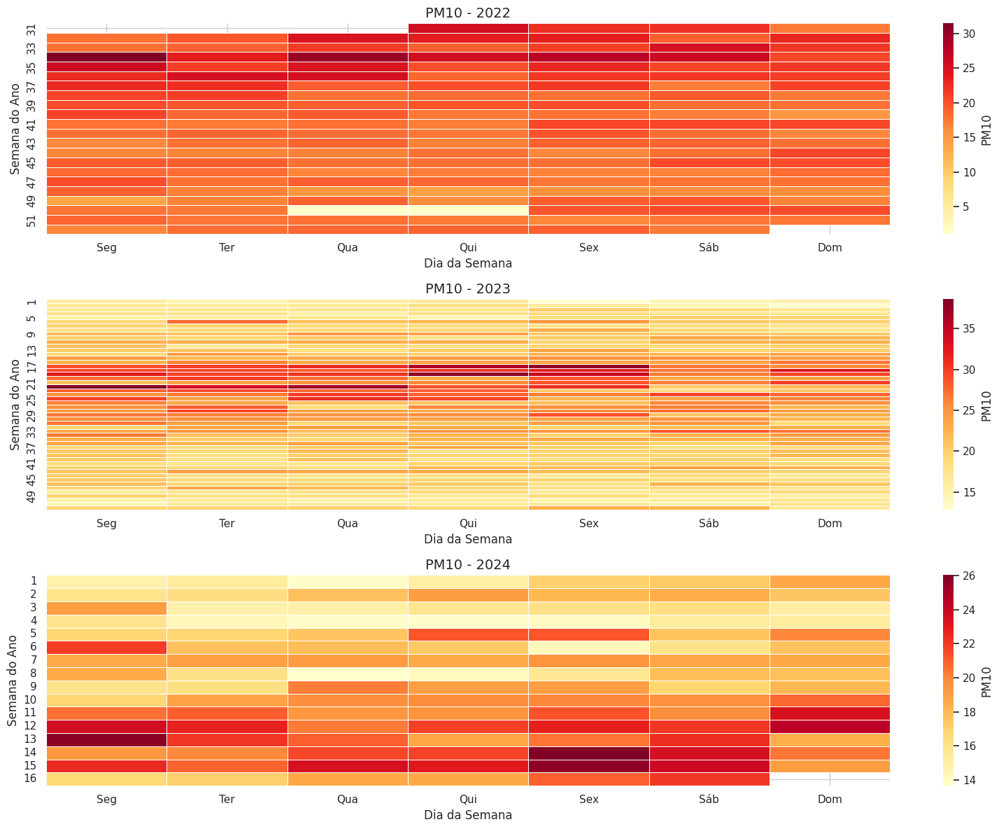

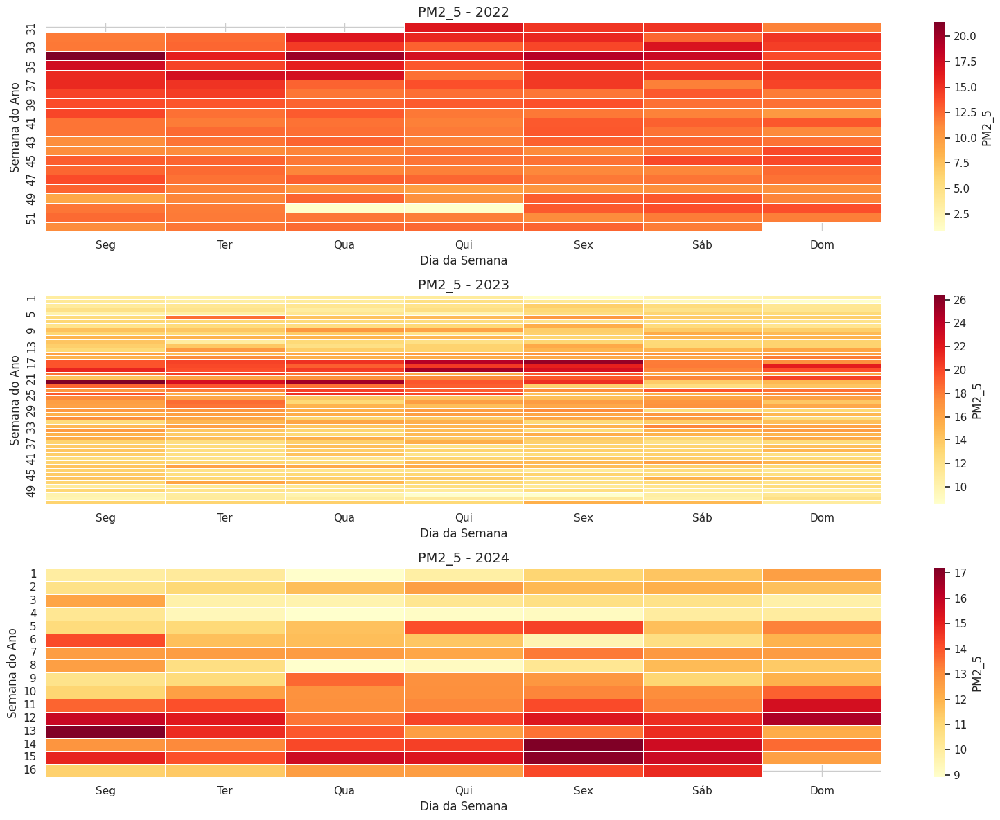

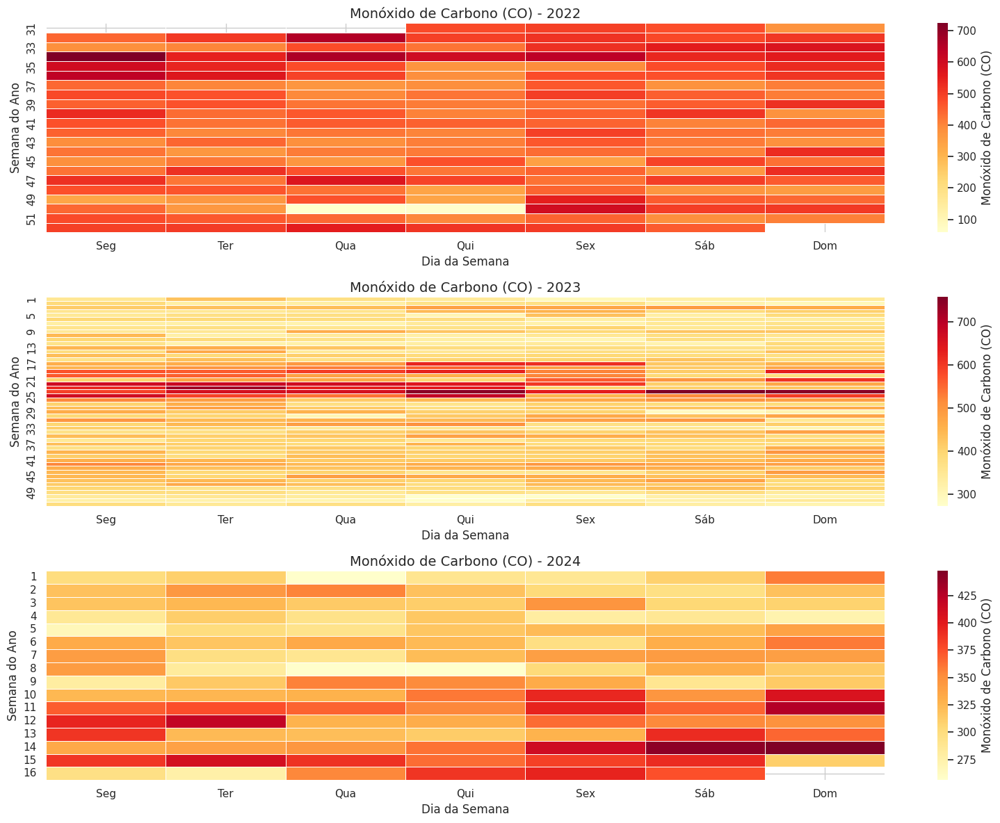

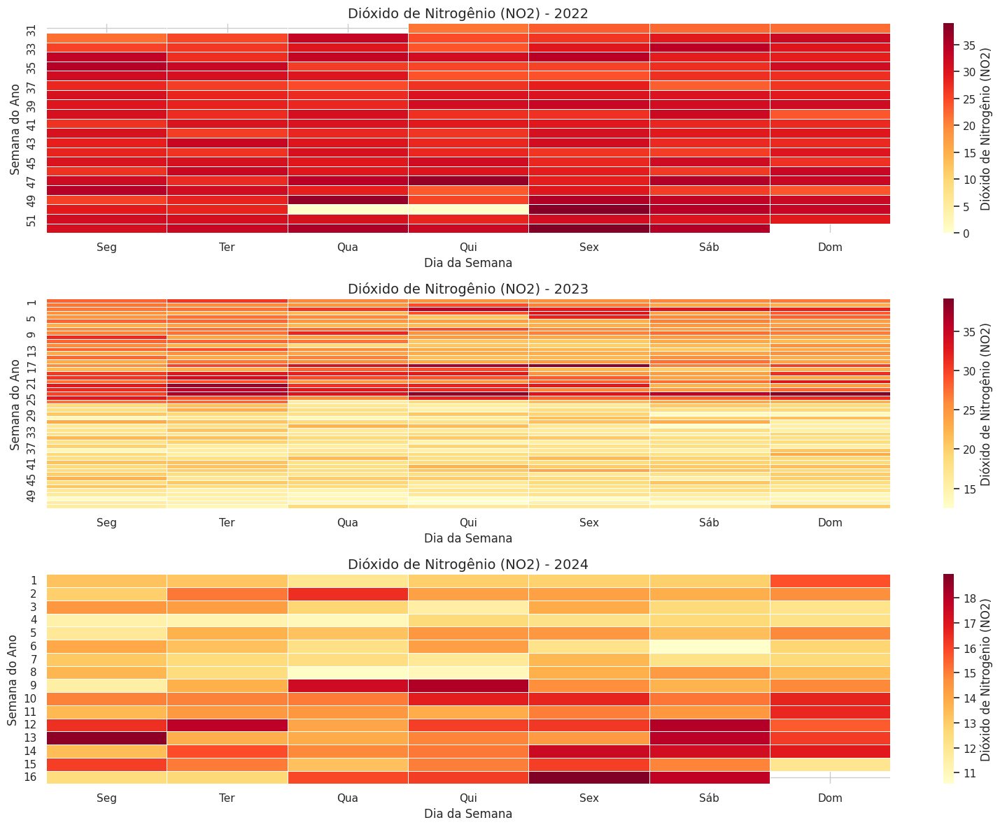

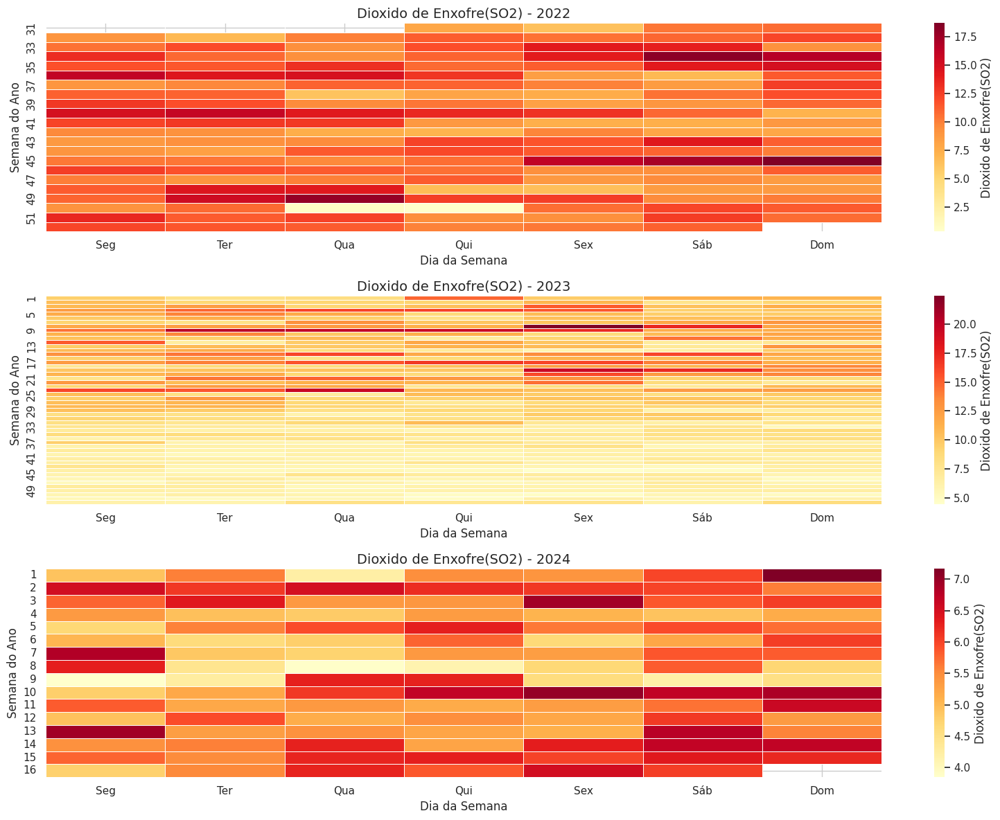

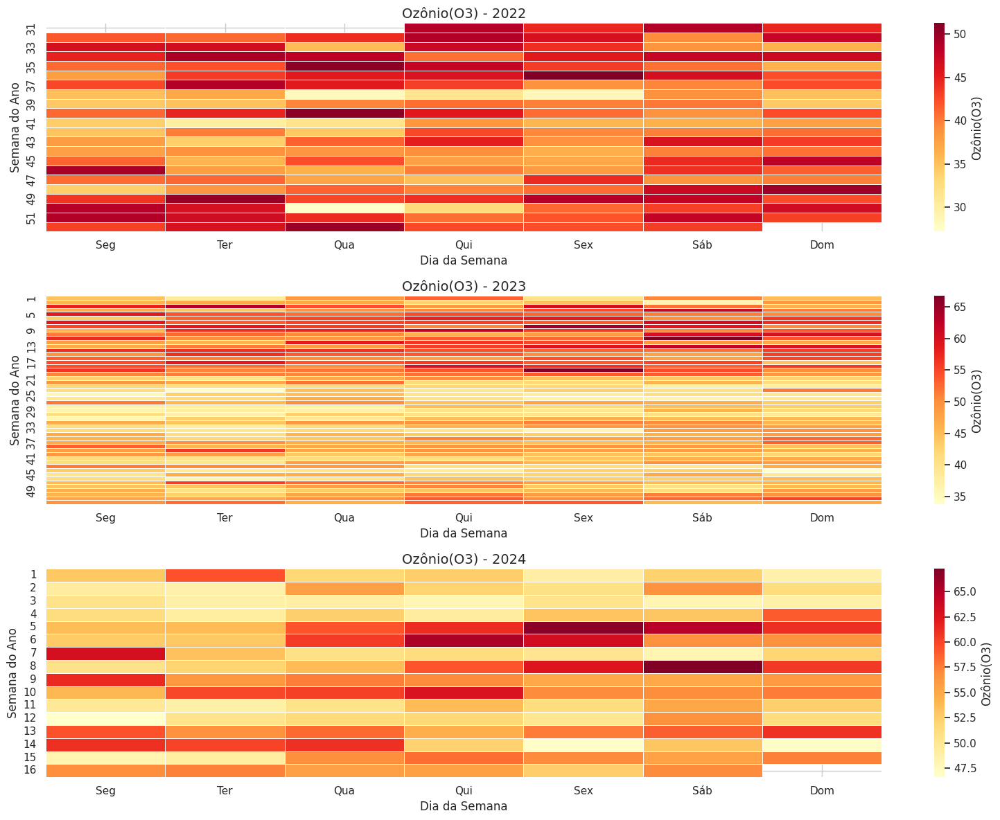

In [16]:
#Calendar Heatmap por ano da concentração de gases nas capitais da América Latina, exceto Brasília

# --- PRE-PROCESSAMENTO ---
dados_clima['Data'] = pd.to_datetime(dados_clima['Data'], errors='coerce')
dados_plot = dados_clima.dropna(subset=['Data']).copy()
dados_plot['Ano'] = dados_plot['Data'].dt.year
dados_plot['DiaDoAno'] = dados_plot['Data'].dt.dayofyear

indicadores_poluicao = [
    'PM10', 'PM2_5', 'Monóxido de Carbono (CO)',
    'Dióxido de Nitrogênio (NO2)', 'Dioxido de Enxofre(SO2)',
    'Ozônio(O3)'
]

anos_disponiveis = [2022, 2023, 2024]

# --- LOOP PARA CADA INDICADOR ---
for indicador in indicadores_poluicao:
    plt.figure(figsize=(16, 4 * len(anos_disponiveis)))

    for i, ano in enumerate(anos_disponiveis):
        df_ano = dados_plot[dados_plot['Ano'] == ano].copy()
        if df_ano.empty:
            continue

        # Criar pivot table: linha = semana do ano, coluna = dia da semana
        df_ano['Semana'] = df_ano['Data'].dt.isocalendar().week
        df_ano['DiaSemana'] = df_ano['Data'].dt.weekday  # 0 = segunda, 6 = domingo
        pivot = df_ano.pivot_table(index='Semana', columns='DiaSemana', values=indicador)

        ax = plt.subplot(len(anos_disponiveis), 1, i + 1)
        sns.heatmap(pivot, cmap="YlOrRd", linewidths=0.5, linecolor='white', cbar_kws={'label': indicador})
        ax.set_title(f"{indicador} - {ano}", fontsize=14)
        ax.set_ylabel("Semana do Ano")
        ax.set_xlabel("Dia da Semana")
        ax.set_xticklabels(['Seg', 'Ter', 'Qua', 'Qui', 'Sex', 'Sáb', 'Dom'])

    plt.tight_layout()
    plt.show()


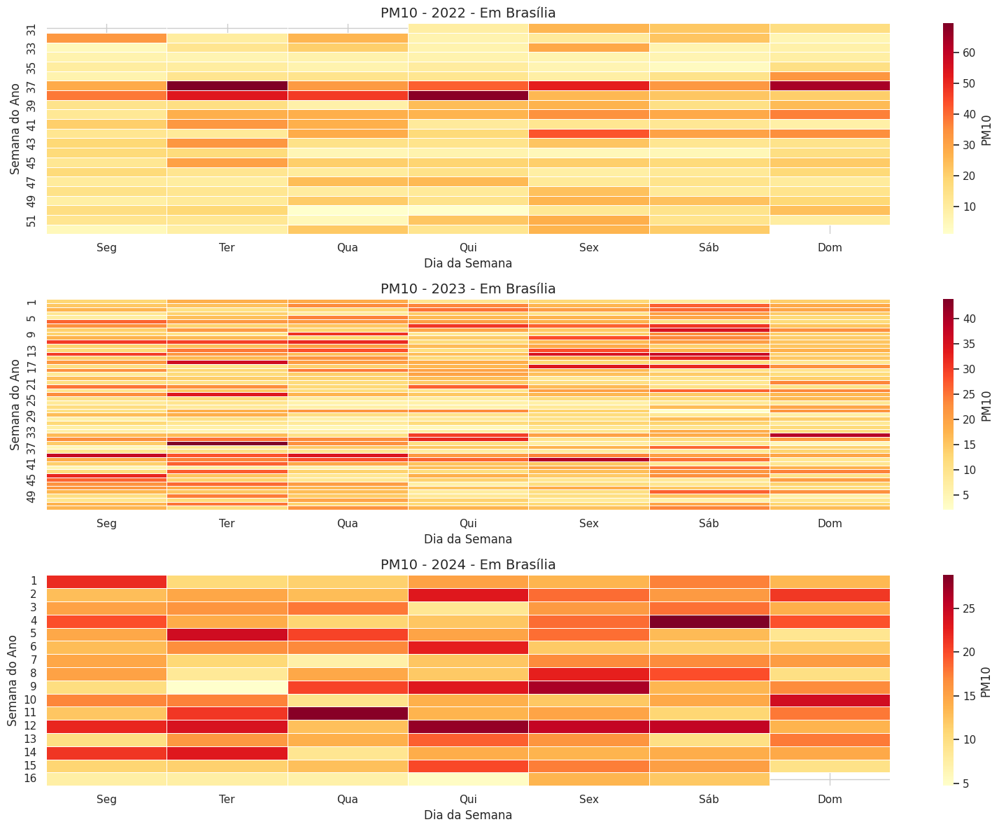

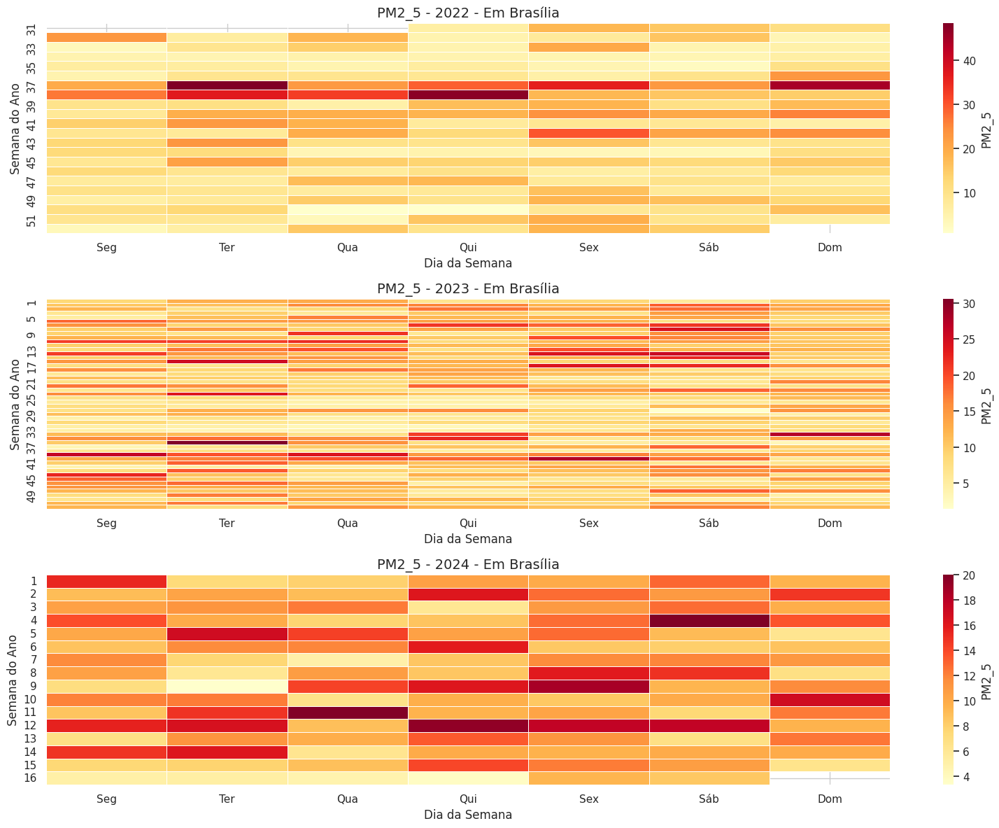

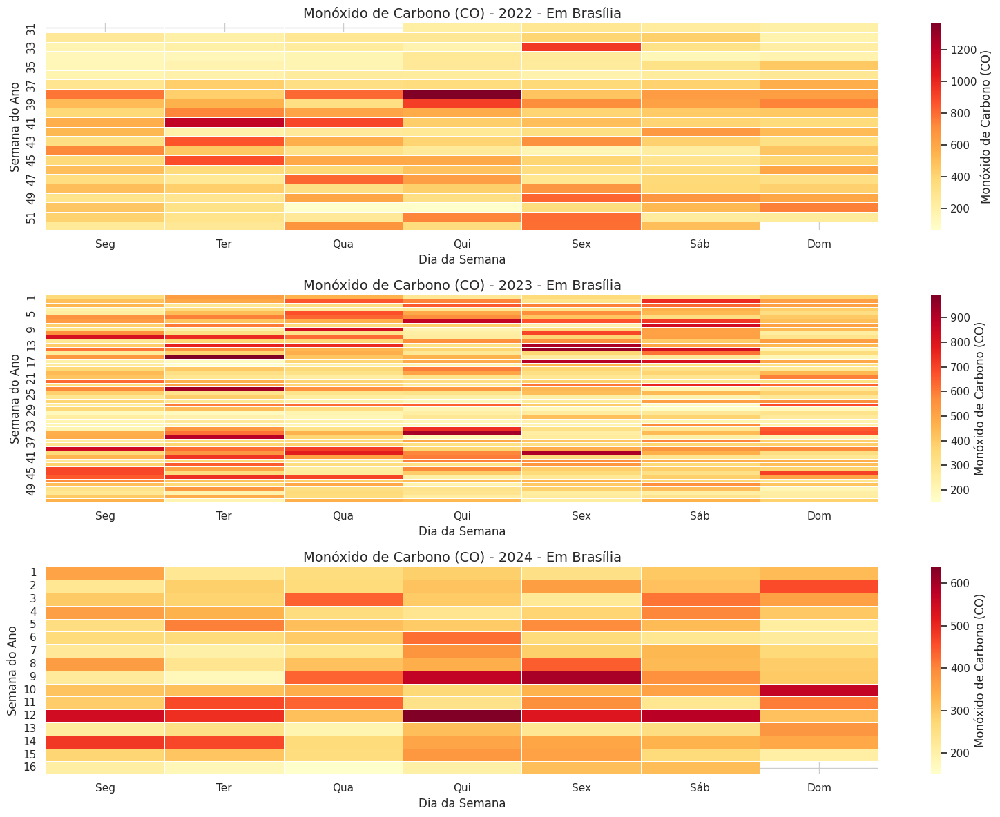

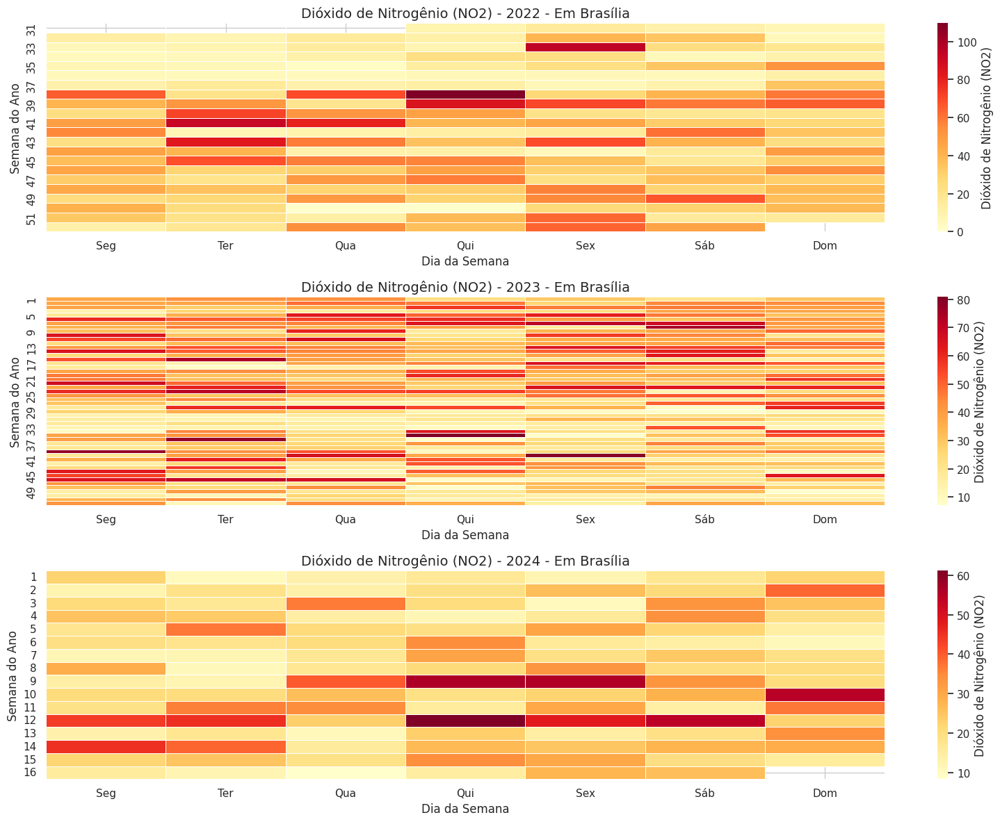

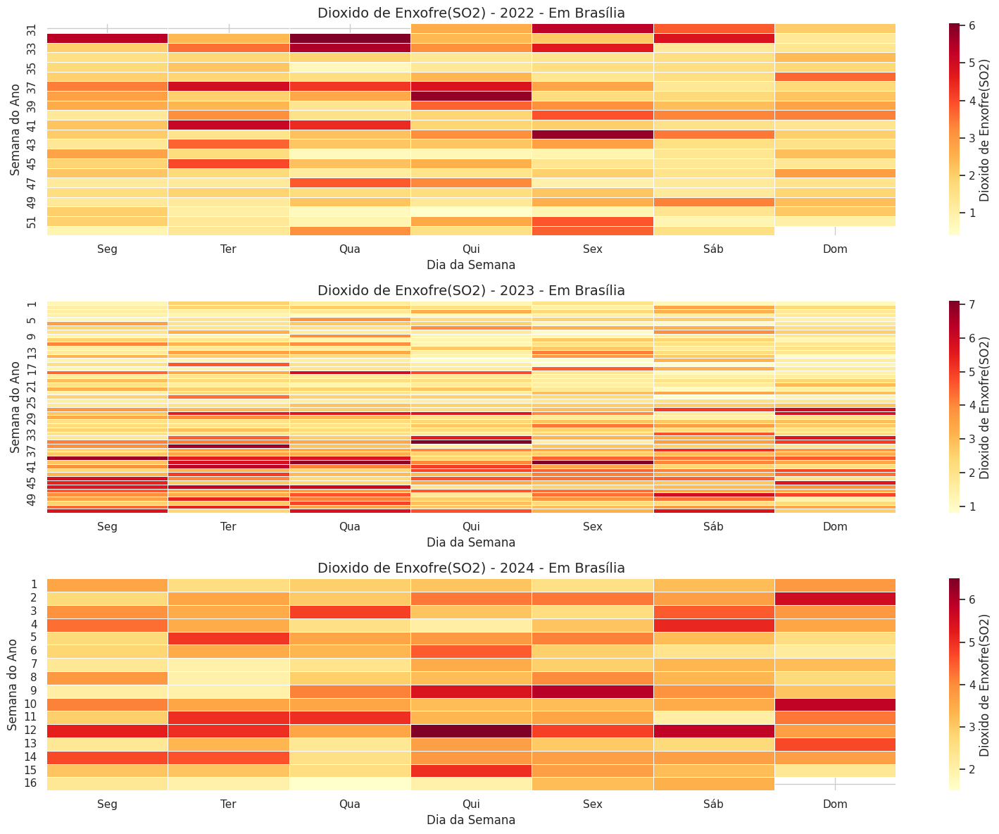

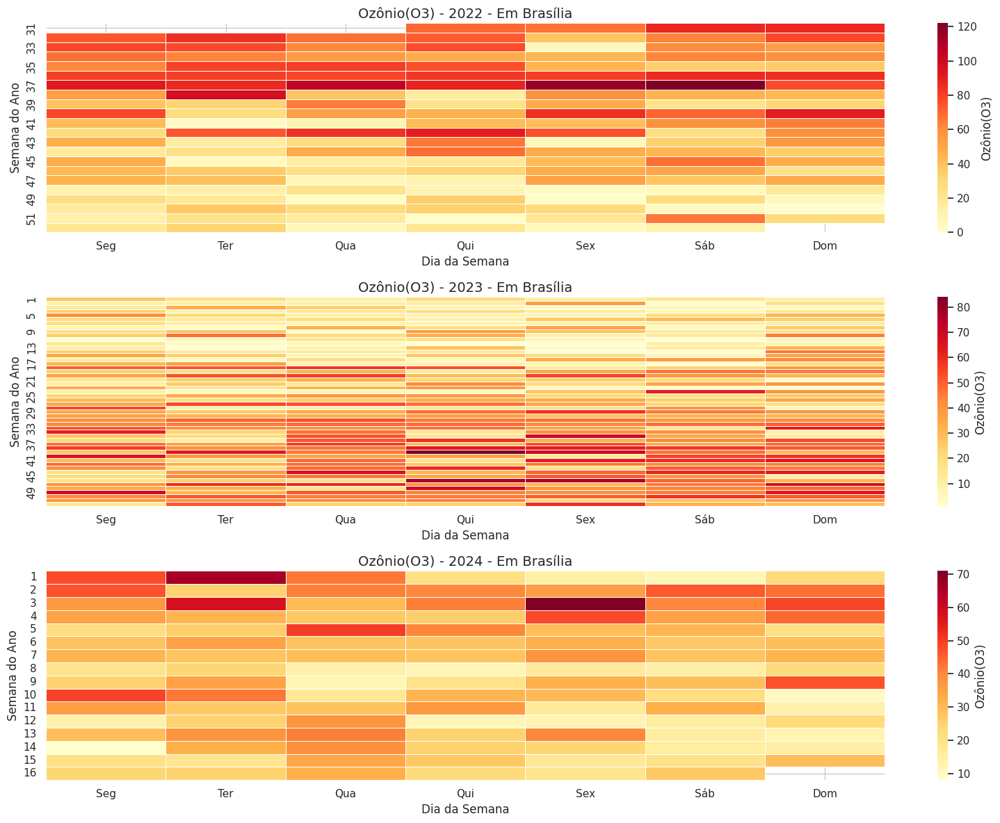

In [17]:
#Calendar Heatmap por ano da concentração de gases em Brasília

# --- PRE-PROCESSAMENTO ---

dados_plot = (
    dados_clima[dados_clima['Cidade'] == 'Brasília']
    .dropna(subset=['Data'])
    .copy()
)
dados_plot['Ano'] = dados_plot['Data'].dt.year
dados_plot['DiaDoAno'] = dados_plot['Data'].dt.dayofyear

indicadores_poluicao = [
    'PM10', 'PM2_5', 'Monóxido de Carbono (CO)',
    'Dióxido de Nitrogênio (NO2)', 'Dioxido de Enxofre(SO2)',
    'Ozônio(O3)'
]

anos_disponiveis = [2022, 2023, 2024]

# --- LOOP PARA CADA INDICADOR ---
for indicador in indicadores_poluicao:
    plt.figure(figsize=(16, 4 * len(anos_disponiveis)))

    for i, ano in enumerate(anos_disponiveis):
        df_ano = dados_plot[dados_plot['Ano'] == ano].copy()
        if df_ano.empty:
            continue

        # Criar pivot table: linha = semana do ano, coluna = dia da semana
        df_ano['Semana'] = df_ano['Data'].dt.isocalendar().week
        df_ano['DiaSemana'] = df_ano['Data'].dt.weekday  # 0 = segunda, 6 = domingo
        pivot = df_ano.pivot_table(index='Semana', columns='DiaSemana', values=indicador)

        ax = plt.subplot(len(anos_disponiveis), 1, i + 1)
        sns.heatmap(pivot, cmap="YlOrRd", linewidths=0.5, linecolor='white', cbar_kws={'label': indicador})
        ax.set_title(f"{indicador} - {ano} - Em Brasília", fontsize=14)
        ax.set_ylabel("Semana do Ano")
        ax.set_xlabel("Dia da Semana")
        ax.set_xticklabels(['Seg', 'Ter', 'Qua', 'Qui', 'Sex', 'Sáb', 'Dom'])

    plt.tight_layout()
    plt.show()


De forma geral, a análise mostra que as maiores concentrações de poluentes ocorreram no mês de maio, indicando um possível aumento das emissões ou condições climáticas menos favoráveis à dispersão nesse período. Já em Brasília, o pico de concentração foi observado em setembro, mês que coincide com a estação seca no Centro-Oeste, caracterizada por baixos níveis de umidade, maior ocorrência de queimadas e menor ventilação, fatores que favorecem o acúmulo de poluentes na atmosfera.

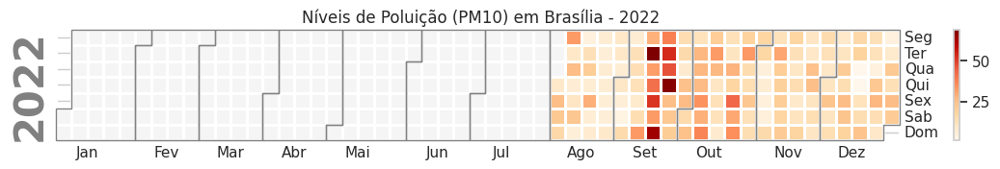

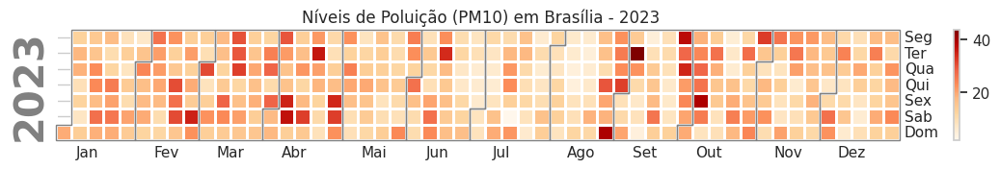

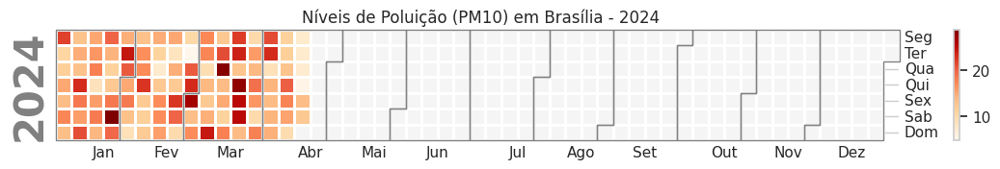

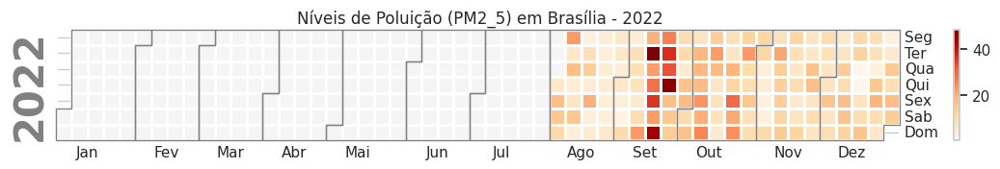

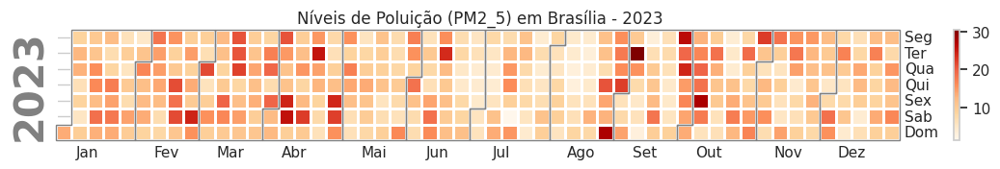

...

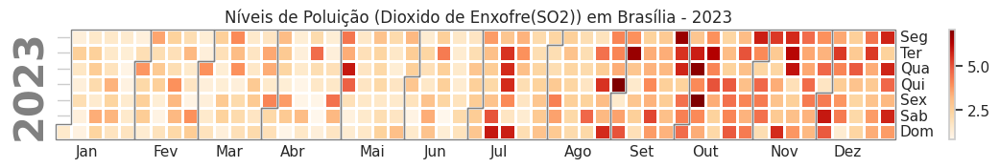

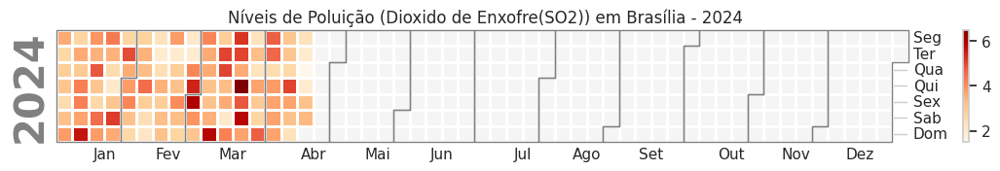

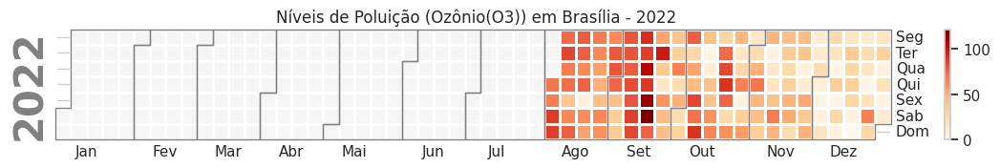

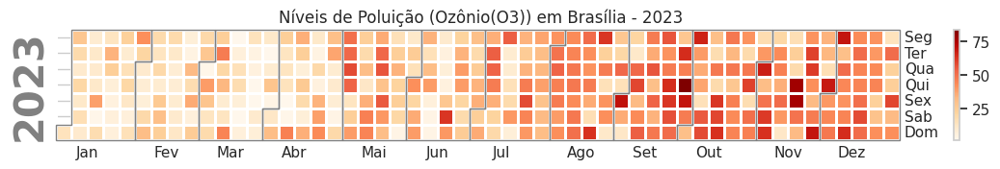

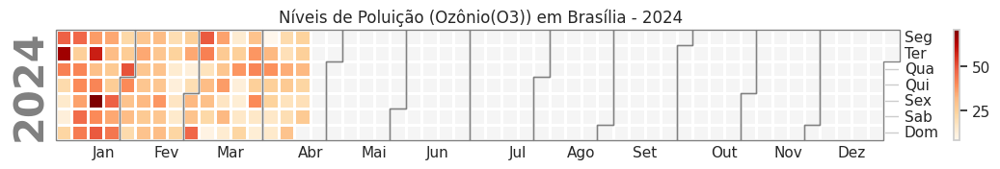

In [18]:
# Calendar heatmap com calplot para Brasília (teste) - ver se é visualmente mais atrativo
import pandas as pd
import calplot
import matplotlib.pyplot as plt
import logging

# Silenciar warnings de fonte
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

dados_climacp = dados_clima.copy()
# Garantir que data é datetime
dados_climacp['Data'] = pd.to_datetime(dados_climacp['Data'])
# Tirando fuso
dados_climacp['Data'] = dados_climacp['Data'].dt.tz_localize(None)
# Filtrar Brasília
df_brasilia = dados_climacp[dados_climacp['Cidade'] == 'Brasília'].copy()
# Lista dos poluentes
poluentes = [
    'PM10',
    'PM2_5',
    'Monóxido de Carbono (CO)',
    'Dióxido de Nitrogênio (NO2)',
    'Dioxido de Enxofre(SO2)',
    'Ozônio(O3)'
]
# Gerar calendar heatmap para cada poluente em cada ano
anos = [2022, 2023, 2024]
for poluente in poluentes:
  for ano in anos:
    df_ano = df_brasilia[df_brasilia['Data'].dt.year == ano].copy()
    df_ano.set_index('Data', inplace=True)
    values = df_ano[poluente].dropna()
    calplot.calplot(
        values,
        cmap='OrRd',
        daylabels=['Seg', 'Ter', 'Qua', 'Qui', 'Sex', 'Sab', 'Dom'],
        monthlabels=['Jan', 'Fev', 'Mar', 'Abr', 'Mai', 'Jun', 'Jul', 'Ago', 'Set', 'Out', 'Nov', 'Dez'],
        suptitle=f'Níveis de Poluição ({poluente}) em Brasília - {ano}',
        suptitle_kws={'fontsize': 12, 'y': 1.02}
    )

4- Describe geral da tabela, mostrando os dados que temos e algumas caracteristicas gerais deles

In [19]:
dados_clima.describe()

,Latitude,Longitude,PM10,PM2_5,Monóxido de Carbono (CO),Dióxido de Nitrogênio (NO2),Dioxido de Enxofre(SO2),Ozônio(O3)
count,12640.000000,12640.000000,12520.000000,12520.000000,12520.000000,12520.000000,12520.000000,12520.000000
mean,-0.351840,-74.647240,20.669625,13.758530,414.904233,22.484069,8.930359,47.499201
std,19.473623,12.946283,16.881122,11.665622,496.742344,24.845234,13.674541,32.397686
min,-34.901100,-99.133200,0.300000,0.200000,58.000000,0.000000,0.000000,0.000000
25%,-16.624925,-84.627075,11.400000,7.500000,181.000000,6.700000,1.700000,26.000000
50%,9.455250,-75.557450,17.100000,11.200000,263.000000,15.100000,4.100000,42.000000
75%,14.212950,-66.493175,24.700000,16.500000,444.000000,30.900000,10.200000,62.000000
max,23.113600,-47.921800,292.400000,204.900000,7635.000000,324.400000,166.200000,332.000000


5- visualização geral dos indices, com mapa interativo da seria temporal mostrando a evolução da temp, da evapotranspiração e do vento

tentar juntar isso com uma visualização geral das variaveis

6- estruturar uma ideia pra medir a qualidade do ar

✅ Indicadores a serem analisados: ['PM10', 'PM2_5', 'Dióxido de Nitrogênio (NO2)', 'Ozônio(O3)', 'Monóxido de Carbono (CO)', 'Dioxido de Enxofre(SO2)']


/tmp/ipython-input-198335559.py:58: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



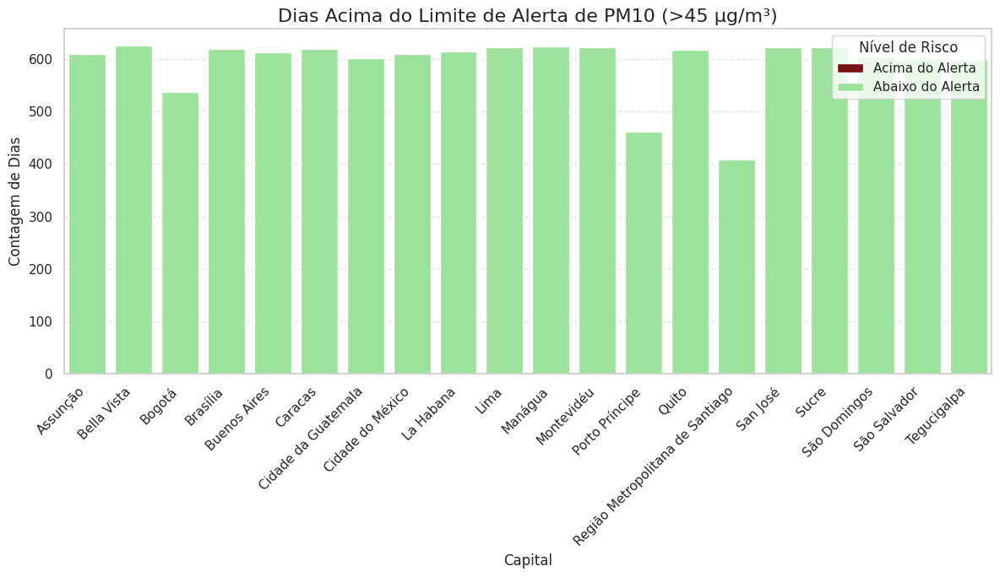

/tmp/ipython-input-198335559.py:58: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



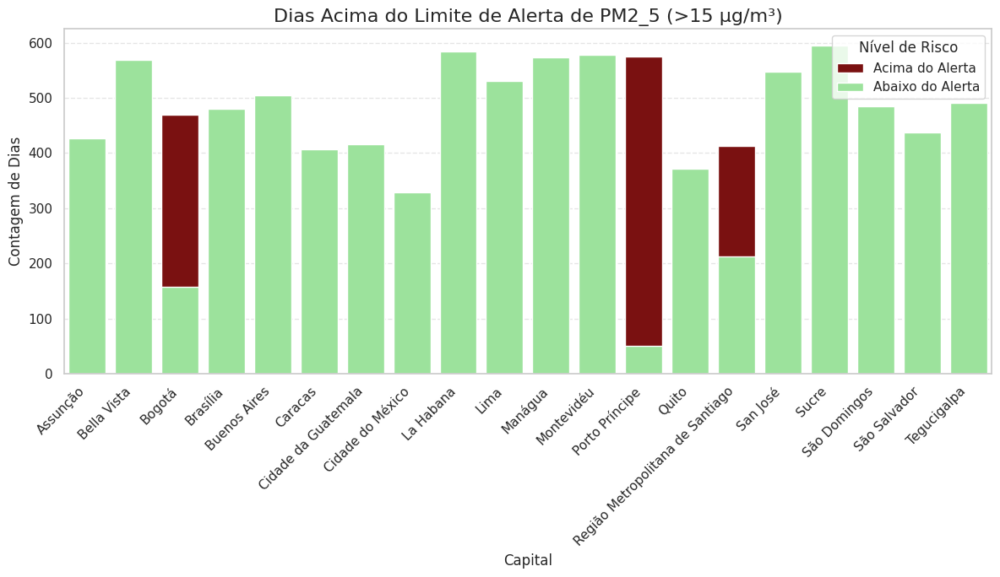

/tmp/ipython-input-198335559.py:58: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



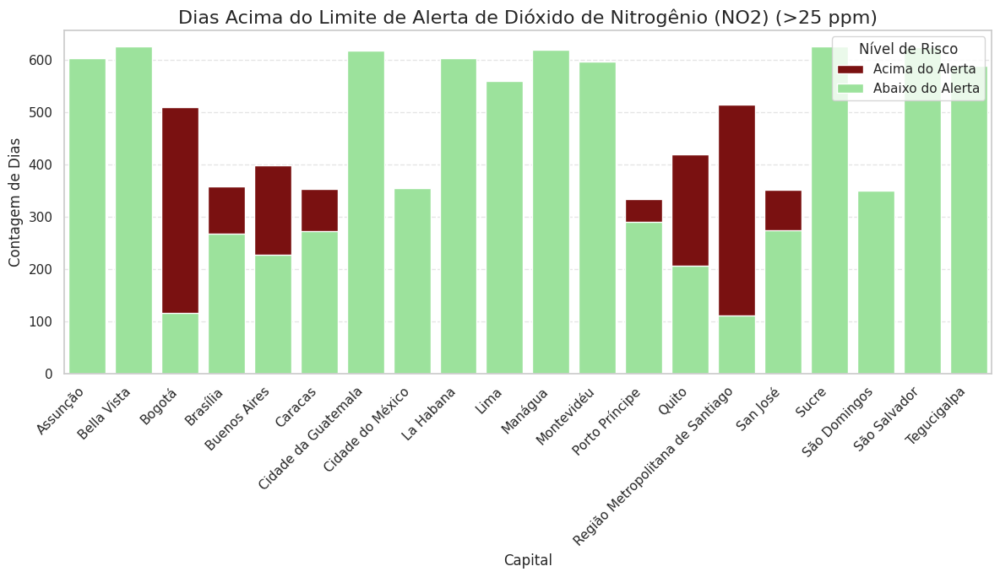

/tmp/ipython-input-198335559.py:58: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



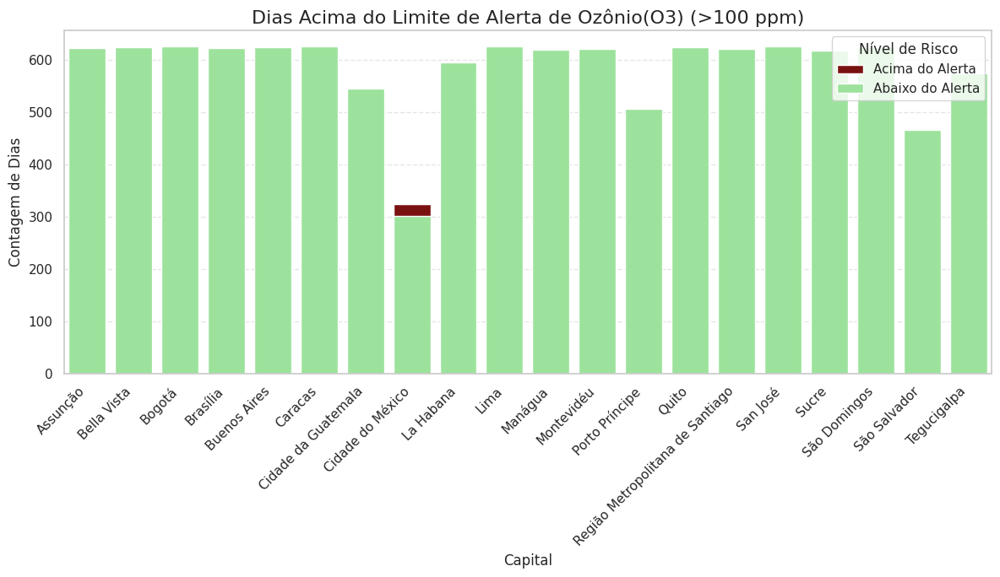

/tmp/ipython-input-198335559.py:58: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



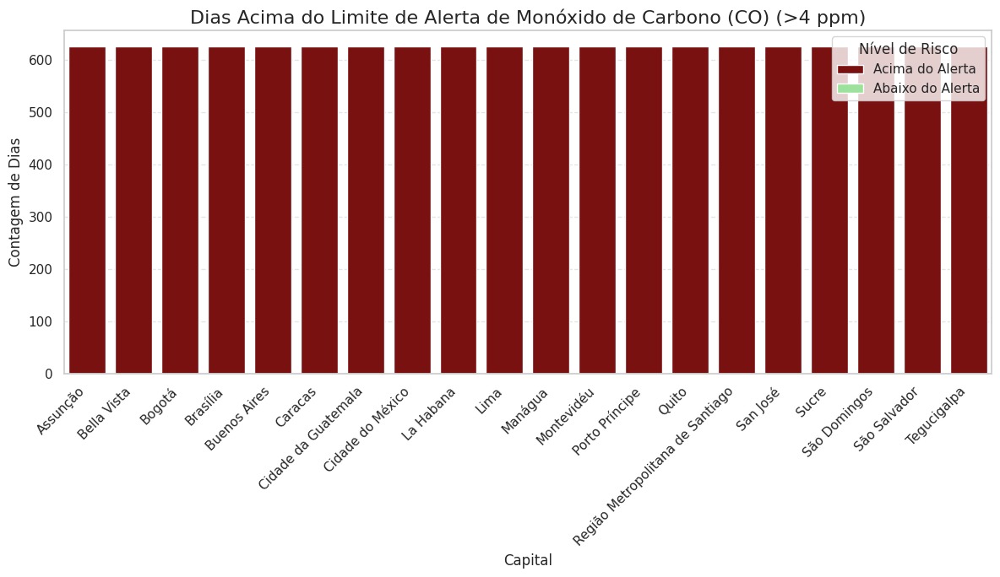

/tmp/ipython-input-198335559.py:58: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



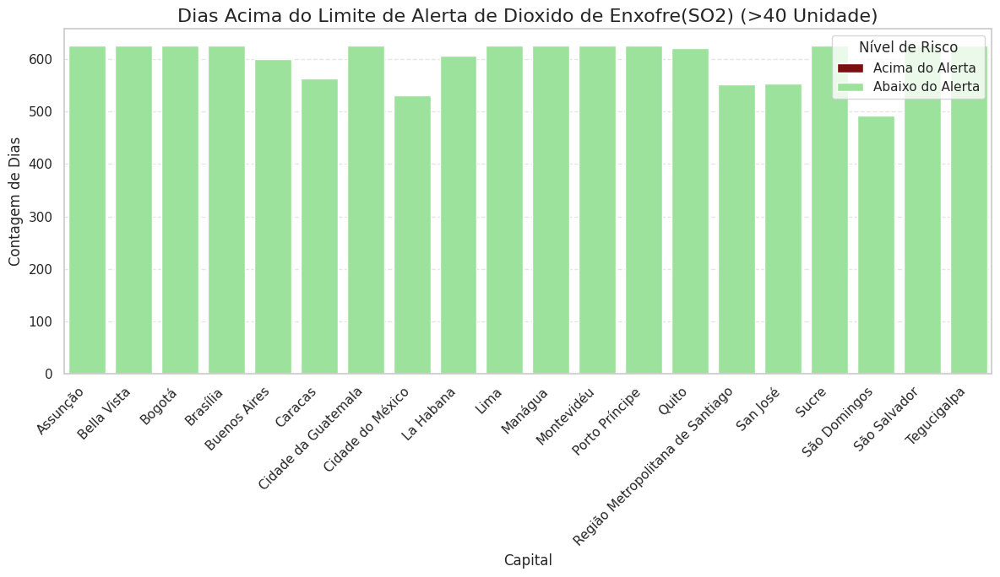

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- 0. PREPARAÇÃO E DEFINIÇÃO DE LIMITES ---

# 1. Garantir que a coluna 'Data' seja do tipo datetime (manter)
dados_clima['Data'] = pd.to_datetime(dados_clima['Data'], errors='coerce')
df_eventos_base = dados_clima.dropna(subset=['Cidade']).copy()

# 2. DEFINIÇÃO DE LIMITES DE ALERTA (Ajuste estes valores conforme a norma desejada)
# Assumimos limites diários ou de 24h, exceto para CO (que geralmente é 8h)
limites_alerta = {
    'PM10': 45,    # μg/m³
    'PM2_5': 15,   # μg/m³
    'Dióxido de Nitrogênio (NO2)': 25,    # μg/m³
    'Ozônio(O3)': 100,     # μg/m³
    'Monóxido de Carbono (CO)': 4,       # ppm
    'Dioxido de Enxofre(SO2)': 40      # μg/m³
}

# Filtra a lista para incluir SOMENTE as colunas que realmente existem no DataFrame
colunas_disponiveis = df_eventos_base.columns.tolist()
indicadores_poluicao = [ind for ind in limites_alerta.keys() if ind in colunas_disponiveis]

# Dicionário de unidades (para o título)
unidades = {
    'PM10': 'μg/m³',
    'PM2_5': 'μg/m³',
    'Ozônio(O3)': 'ppm',
    'Dióxido de Nitrogênio (NO2)': 'ppm',
    'Monóxido de Carbono (CO)': 'ppm',
    'Dióxido de Enxofre(SO2)':'ppm'
}

print(f"✅ Indicadores a serem analisados: {indicadores_poluicao}")

# --- 3. FUNÇÃO PARA GERAR O GRÁFICO DE BARRAS EMPILHADAS ---

def plot_contagem_de_eventos(df_base, indicador, limite, unidade):

    # Remove NaN para as colunas necessárias para o plot
    df_plot = df_base.dropna(subset=[indicador, 'Cidade']).copy()

    if df_plot.empty:
        print(f"Aviso: Dados insuficientes para plotar {indicador}.")
        return

    # CLASSIFICAÇÃO POR CATEGORIA DE RISCO
    df_plot['Risco'] = pd.cut(
        df_plot[indicador],
        bins=[-float('inf'), limite, float('inf')],
        labels=['Abaixo do Alerta', 'Acima do Alerta'],
        right=False
    )

    # AGRUPAMENTO E CONTAGEM
    df_contagem = df_plot.groupby(['Cidade', 'Risco']).size().reset_index(name='Contagem_Dias')

    # Garantir a ordem das categorias (importante para o empilhamento)
    df_contagem['Risco'] = pd.Categorical(
        df_contagem['Risco'],
        categories=['Abaixo do Alerta', 'Acima do Alerta'],
        ordered=True
    )

    # --- GERAÇÃO DO PLOT ---
    plt.figure(figsize=(12, 7))

    sns.barplot(
        data=df_contagem,
        x='Cidade',
        y='Contagem_Dias',
        hue='Risco',
        hue_order=['Acima do Alerta', 'Abaixo do Alerta'], # O mais crítico primeiro
        dodge=False, # Essencial para empilhar
        palette={'Acima do Alerta': 'darkred', 'Abaixo do Alerta': 'lightgreen'}
    )

    # AJUSTES FINAIS DO LAYOUT
    unidade_str = unidade.get(indicador, 'Unidade')
    titulo = f'Dias Acima do Limite de Alerta de {indicador} (>{limite} {unidade_str})'

    plt.title(titulo, fontsize=16)
    plt.xlabel('Capital', fontsize=12)
    plt.ylabel('Contagem de Dias', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Nível de Risco', loc='upper right')
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


# --- 4. EXECUÇÃO DO LOOP PARA TODOS OS INDICADORES ---

for indicador in indicadores_poluicao:
    limite = limites_alerta[indicador]
    plot_contagem_de_eventos(df_eventos_base, indicador, limite, unidades)

##**Intervalo de Confiança**



1- A média dos níveis de poluição em Brasília difere de forma estatisticamente significativa da média das outras capitais da América Latina?


Antes de executar um Teste de Hipóteses, vamos fazer uma comparação e análise visual envolvendo Intervalos de Confiança.

In [21]:
indicadores_poluicao = [
    'PM10', 'PM2_5', 'Monóxido de Carbono (CO)',
    'Dióxido de Nitrogênio (NO2)', 'Dioxido de Enxofre(SO2)',
    'Ozônio(O3)'
]
media_cidades = dados_clima[indicadores_poluicao + ['Cidade']].groupby('Cidade').mean().reset_index()

In [22]:
media_cidades

,Cidade,PM10,PM2_5,Monóxido de Carbono (CO),Dióxido de Nitrogênio (NO2),Dioxido de Enxofre(SO2),Ozônio(O3)
0,Assunção,18.810703,13.113898,336.381789,8.830911,0.667173,42.722045
1,Bella Vista,15.604633,9.694249,202.400958,8.472045,4.135543,54.314696
2,Bogotá,30.747444,21.546326,897.638978,37.555751,9.121885,20.544728
3,Brasília,16.501438,11.519010,402.910543,31.909824,2.828275,34.373802
4,Buenos Aires,15.860383,10.664696,388.857827,34.535863,14.000559,21.153355
5,Caracas,19.557508,13.438818,499.789137,29.704233,17.062141,21.712460
6,Cidade da Guatemala,20.723802,14.196326,304.244409,8.562780,2.169249,66.006390
7,Cidade do México,22.703035,15.520447,451.060703,27.372684,23.056150,109.525559
8,La Habana,16.501757,9.255112,155.889776,8.576677,11.410304,66.364217
9,Lima,20.578754,12.510224,179.531949,19.921326,6.781070,33.984026


In [23]:
brasilia = media_cidades[media_cidades['Cidade'] == 'Brasília'][indicadores_poluicao]
outras = media_cidades[media_cidades['Cidade'] != 'Brasília'][indicadores_poluicao]

In [24]:
#IC para a média
from scipy import stats

def ic_media(data, confianca=0.95):
    data.dropna()
    n = len(data)
    mean = np.mean(data)
    sem = stats.sem(data)  # erro padrão da média
    t= stats.t.ppf((1 + confianca) / 2, n - 1)
    return mean, mean - t * sem, mean + t * sem

In [25]:
for poluente in indicadores_poluicao:
    mean_o, lower_o, upper_o = ic_media(outras[poluente])

    print(f"{poluente}:")
    print(f"  Cidades da América Latina (exceto Brasília):   {mean_o:.2f} [{lower_o:.2f}, {upper_o:.2f}]\n")

PM10:
  Cidades da América Latina (exceto Brasília):   20.89 [16.24, 25.54]

PM2_5:
  Cidades da América Latina (exceto Brasília):   13.88 [10.61, 17.15]

Monóxido de Carbono (CO):
  Cidades da América Latina (exceto Brasília):   415.54 [255.97, 575.10]

Dióxido de Nitrogênio (NO2):
  Cidades da América Latina (exceto Brasília):   21.99 [14.00, 29.98]

Dioxido de Enxofre(SO2):
  Cidades da América Latina (exceto Brasília):   9.25 [5.66, 12.84]

Ozônio(O3):
  Cidades da América Latina (exceto Brasília):   48.19 [36.63, 59.75]



In [26]:
print("Médias de Brasília:\n")
for poluente in indicadores_poluicao:
    print(f"{poluente}: {brasilia[poluente].mean()}")

Médias de Brasília:

PM10: 16.501437699680512
PM2_5: 11.519009584664536
Monóxido de Carbono (CO): 402.9105431309904
Dióxido de Nitrogênio (NO2): 31.909824281150158
Dioxido de Enxofre(SO2): 2.8282747603833864
Ozônio(O3): 34.373801916932905


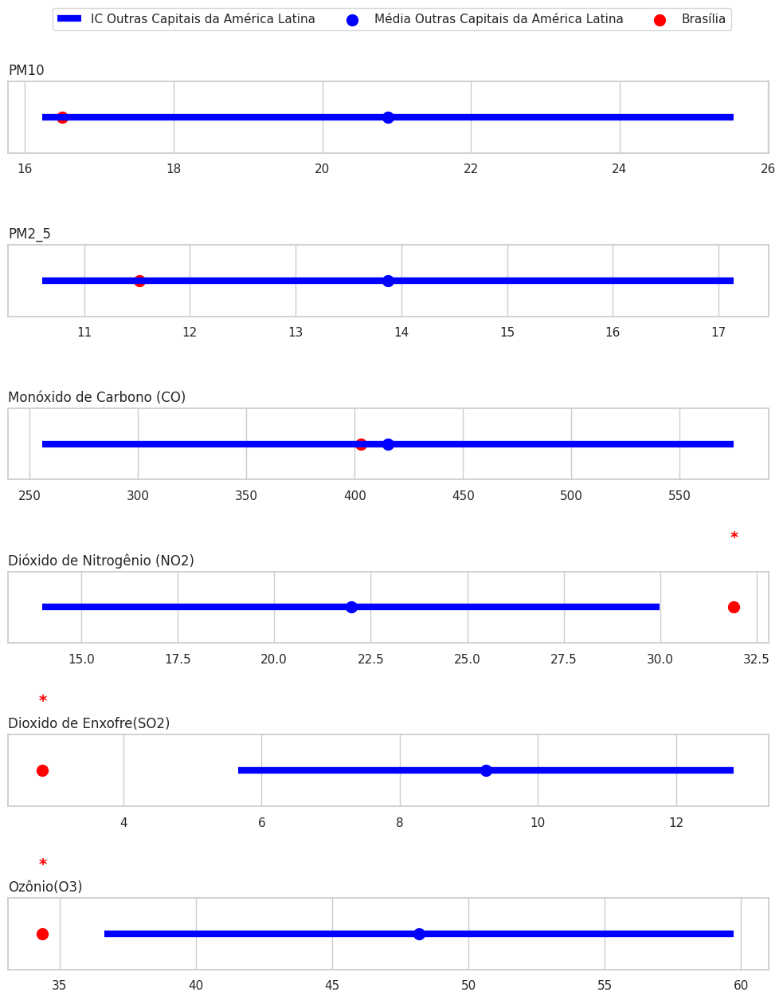

In [27]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Função IC
def ic_media(data, confianca=0.95):
    n = len(data)
    mean = np.mean(data)
    sem = stats.sem(data)
    h = sem * stats.t.ppf((1 + confianca) / 2., n-1)
    return mean, mean - h, mean + h

# Preparar dados
poluentes = []
medias_outras = []
ic_outras = []
brasilia_valores = []

for poluente in indicadores_poluicao:
    mean_o, lower_o, upper_o = ic_media(outras[poluente])
    val_b = brasilia[poluente].iloc[0]

    poluentes.append(poluente)
    medias_outras.append(mean_o)
    ic_outras.append((lower_o, upper_o))
    brasilia_valores.append(val_b)

# --- Plot horizontal ---
fig, axes = plt.subplots(len(indicadores_poluicao), 1, figsize=(10, 2*len(indicadores_poluicao)), sharex=False)

for i, poluente in enumerate(indicadores_poluicao):
    lower, upper = ic_outras[i]
    mean_o = medias_outras[i]
    val_b = brasilia_valores[i]

    # IC das outras cidades (barra horizontal)
    axes[i].hlines(y=0.5, xmin=lower, xmax=upper, color='blue', lw=6, label='IC Outras Capitais da América Latina')
    axes[i].scatter(mean_o, 0.5, color='blue', s=100, label='Média Outras Capitais da América Latina')
    axes[i].scatter(val_b, 0.5, color='red', s=100, label='Brasília')

    # Marcar com asterisco se Brasília estiver fora do IC
    if val_b < lower or val_b > upper:
        axes[i].text(val_b, 0.55, '*', color='red', fontsize=14, fontweight='bold', ha='center')

    axes[i].set_yticks([])
    axes[i].set_title(poluente, loc='left')

# Colocar legenda **acima de todos os subplots**
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=3, bbox_to_anchor=(0.5, 1.05))

plt.tight_layout()
plt.show()


Isso nos traz uma boa intuição, mas é preciso realizar um teste de hipótese formal para tirar conclusões.

# **Teste de Hipóteses**

Hipótese nula (H0): A média de Brasília é igual à média das outras capitais da América Latina.

Hipótese alternativa (H1): A média de Brasília é diferente da média das outras capitais da América Latina.

In [28]:
brasilia_valores=dados_clima[dados_clima['Cidade']=='Brasília']
outras_valores=dados_clima[dados_clima['Cidade']!='Brasília']

Primeiramente, verifica se as variâncias são iguais ou diferentes.

In [29]:
import numpy as np
from scipy.stats import f
print("--- Teste de Variância ---\n")
for poluente in indicadores_poluicao:

  print(f"Poluente: {poluente}")
  # --- Dados das amostras ---
  amostra1 = np.array(brasilia_valores[poluente].dropna().values)
  amostra2 = np.array(outras_valores[poluente].dropna().values)

  n1 = len(amostra1)
  n2 = len(amostra2)

  s1_sq = np.var(amostra1, ddof=1)  # Variância amostral
  s2_sq = np.var(amostra2, ddof=1)

  # --- Teste F ---
  F_obs = s1_sq / s2_sq
  alpha = 0.05

  # Graus de liberdade
  df1 = n1 - 1
  df2 = n2 - 1

  # Valores críticos para teste bilateral
  F_lower = f.ppf(alpha/2, df1, df2)
  F_upper = f.ppf(1 - alpha/2, df1, df2)

  print(f"Variâncias amostrais: s1^2 = {s1_sq:.2f}, s2^2 = {s2_sq:.2f}")
  print(f"Estatística F observada: {F_obs:.2f}")
  print(f"Região de aceitação: [{F_lower:.2f}, {F_upper:.2f}]")

  if F_obs < F_lower or F_obs > F_upper:
      print("Rejeita H0: variâncias diferentes")
  else:
      print("Não rejeita H0: variâncias podem ser iguais")
  print("\n")


--- Teste de Variância ---

Poluente: PM10
Variâncias amostrais: s1^2 = 72.98, s2^2 = 295.17
Estatística F observada: 0.25
Região de aceitação: [0.89, 1.12]
Rejeita H0: variâncias diferentes


Poluente: PM2_5
Variâncias amostrais: s1^2 = 35.50, s2^2 = 141.11
Estatística F observada: 0.25
Região de aceitação: [0.89, 1.12]
Rejeita H0: variâncias diferentes


Poluente: Monóxido de Carbono (CO)
Variâncias amostrais: s1^2 = 32295.21, s2^2 = 258035.90
Estatística F observada: 0.13
Região de aceitação: [0.89, 1.12]
Rejeita H0: variâncias diferentes


Poluente: Dióxido de Nitrogênio (NO2)
Variâncias amostrais: s1^2 = 317.33, s2^2 = 628.18
Estatística F observada: 0.51
Região de aceitação: [0.89, 1.12]
Rejeita H0: variâncias diferentes


Poluente: Dioxido de Enxofre(SO2)
Variâncias amostrais: s1^2 = 1.75, s2^2 = 194.68
Estatística F observada: 0.01
Região de aceitação: [0.89, 1.12]
Rejeita H0: variâncias diferentes


Poluente: Ozônio(O3)
Variâncias amostrais: s1^2 = 448.63, s2^2 = 1071.74
Estat

Agora, fazemos o teste t para comparação das médias de duas populações, para variâncias desconhecidas e diferentes.

In [30]:
from scipy.stats import ttest_ind
resultados = []

for poluente in indicadores_poluicao:
    # Pegando apenas os valores do poluente
    b = brasilia_valores[poluente].dropna()
    o = outras_valores[poluente].dropna()

    # Teste t de Welch (comparacao das médias; variâncias desconhecidas e diferentes)
    t_stat, p_val = ttest_ind(b, o, equal_var=False)

    resultados.append({
        'Poluente': poluente,
        'Média Brasília': b.mean(),
        'Média das Outras Capitais da América Latina': o.mean(),
        't-Statistic': t_stat,
        'p-Valor': p_val
    })

# Transformar em DataFrame
df_resultados = pd.DataFrame(resultados)
df_resultados


,Poluente,Média Brasília,Média das Outras Capitais da América Latina,t-Statistic,p-Valor
0,PM10,16.501438,20.889003,-11.667822,1.986847e-29
1,PM2_5,11.519010,13.876400,-9.002231,1.263986e-18
2,Monóxido de Carbono (CO),402.910543,415.535480,-1.474767,1.405271e-01
3,Dióxido de Nitrogênio (NO2),31.909824,21.987977,13.261770,2.893329e-36
4,Dioxido de Enxofre(SO2),2.828275,9.251522,-46.402395,0.000000e+00
5,Ozônio(O3),34.373802,48.190012,-15.382038,6.581365e-47


In [31]:
print("Conclusões: \n")
for i in range(len(df_resultados)):
    p_val = df_resultados.loc[i, 'p-Valor']
    poluente = df_resultados.loc[i, 'Poluente']

    if not np.isnan(p_val) and p_val < 0.05: #p-valor < 0.05
        print(f"A diferença entre a média de Brasília e das outras capitais da América Latina para {poluente} é significativa a um nível de confiança de 5%.")
    else:
        print(f"Não há evidência suficiente para afirmar que a média de Brasília é diferente da média das outras capitais da América Latina para {poluente} a um nível de significância de 5%.")

Conclusões: 

A diferença entre a média de Brasília e das outras capitais da América Latina para PM10 é significativa a um nível de confiança de 5%.
A diferença entre a média de Brasília e das outras capitais da América Latina para PM2_5 é significativa a um nível de confiança de 5%.
Não há evidência suficiente para afirmar que a média de Brasília é diferente da média das outras capitais da América Latina para Monóxido de Carbono (CO) a um nível de significância de 5%.
A diferença entre a média de Brasília e das outras capitais da América Latina para Dióxido de Nitrogênio (NO2) é significativa a um nível de confiança de 5%.
A diferença entre a média de Brasília e das outras capitais da América Latina para Dioxido de Enxofre(SO2) é significativa a um nível de confiança de 5%.
A diferença entre a média de Brasília e das outras capitais da América Latina para Ozônio(O3) é significativa a um nível de confiança de 5%.


# **Correlações**

##**Correlações entre gases e variavies do tempo**
Intuitivamente, é relevante investigar se existe alguma relação linar entre as variáveis que temos em nossas bases.
Para avaliar isso, primeiramente os datasets foram copiados e juntados, para facilitar o trabalho.
Em seguida, foram impressos e plotados os dados de cada gá da base com as variáveis climáticas que tínhamos. Pra isso, foi utilizado:


*   **Scatter plot:** mostra a forma da relação.
*   **"r" de Pearson:** retorna um número que mede a força e a direção da relação linar entre as variáveis apresentadas.



In [32]:
dados_climaticos = dados_temp.copy()
dados_gases = dados_clima.copy()

In [33]:
# Certifica-se de que a coluna 'Data' em ambos os dataframes é do tipo datetime
dados_climaticos['Data'] = pd.to_datetime(dados_climaticos['Data'], errors='coerce')
dados_gases['Data'] = pd.to_datetime(dados_gases['Data'], errors='coerce')


colunas_chave = ['Data', 'Latitude', 'Longitude']
df_geral = pd.merge(dados_climaticos, dados_gases, on=colunas_chave, how='inner')

# Exibe as primeiras linhas do dataframe resultante
df_geral.columns

Index(['País', 'Cidade_x', 'Data', 'Latitude', 'Longitude',
       'Temperatura_2m_max', 'Temperatura_2m_min', 'Temperatura_2m_media',
       'Temperatura_aparente_max', 'Temperatura_aparente_min',
       'Temperatura_aparente_media', 'Soma_precipitacao',
       'Velocidade_vento_10m_max', 'Et0_fao_evapotranspiração', 'PM10',
       'PM2_5', 'Monóxido de Carbono (CO)', 'Dióxido de Nitrogênio (NO2)',
       'Dioxido de Enxofre(SO2)', 'Ozônio(O3)', 'Cidade_y', 'Mês_Nome',
       'Dia_Semana_Nome'],
      dtype='object')


Calculando 'r' de Pearson (Correlação) para PM10:
  > Correlação com Temperatura_2m_media:
    r = -0.046   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Temperatura_aparente_media:
    r = -0.037   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Soma_precipitacao:
    r = -0.058   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Velocidade_vento_10m_max:
    r = -0.181   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Et0_fao_evapotranspiração:
    r = -0.085   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)

Gerando gráficos de dispersão (pairplot)...


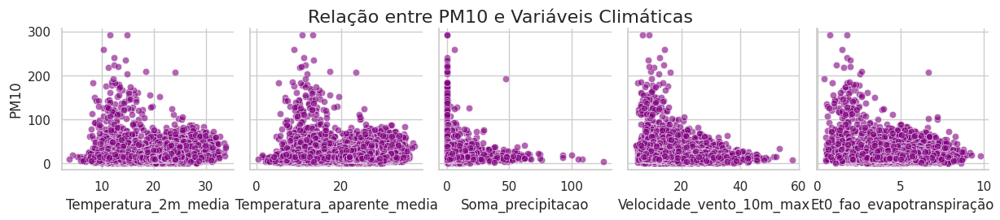


Calculando 'r' de Pearson (Correlação) para PM2_5:
  > Correlação com Temperatura_2m_media:
    r = -0.078   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Temperatura_aparente_media:
    r = -0.068   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Soma_precipitacao:
    r = -0.048   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Velocidade_vento_10m_max:
    r = -0.200   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Et0_fao_evapotranspiração:
    r = -0.097   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)

Gerando gráficos de dispersão (pairplot)...


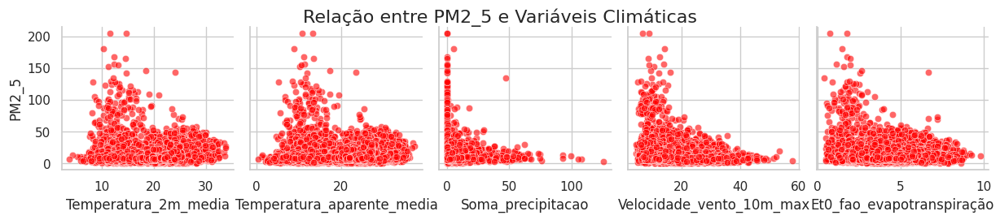


Calculando 'r' de Pearson (Correlação) para Monóxido de Carbono (CO):
  > Correlação com Temperatura_2m_media:
    r = -0.146   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Temperatura_aparente_media:
    r = -0.144   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Soma_precipitacao:
    r = -0.044   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Velocidade_vento_10m_max:
    r = -0.218   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Et0_fao_evapotranspiração:
    r = -0.119   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)

Gerando gráficos de dispersão (pairplot)...


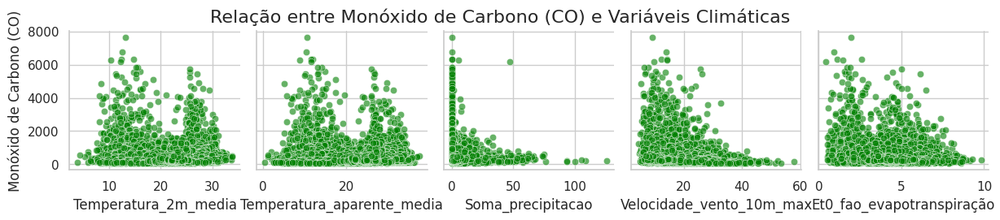


Calculando 'r' de Pearson (Correlação) para Dióxido de Nitrogênio (NO2):
  > Correlação com Temperatura_2m_media:
    r = -0.174   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Temperatura_aparente_media:
    r = -0.164   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Soma_precipitacao:
    r = -0.016   (p-valor:  0.0697)
    (Esta correlação pode ter ocorrido ao acaso)
  > Correlação com Velocidade_vento_10m_max:
    r = -0.240   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Et0_fao_evapotranspiração:
    r = -0.176   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)

Gerando gráficos de dispersão (pairplot)...


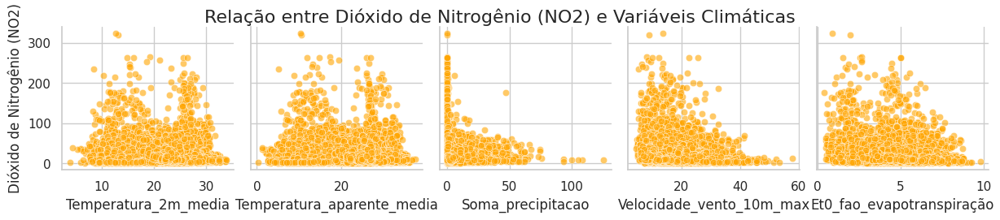


Calculando 'r' de Pearson (Correlação) para Dioxido de Enxofre(SO2):
  > Correlação com Temperatura_2m_media:
    r = -0.096   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Temperatura_aparente_media:
    r = -0.080   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Soma_precipitacao:
    r = -0.053   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Velocidade_vento_10m_max:
    r = -0.137   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Et0_fao_evapotranspiração:
    r = -0.119   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)

Gerando gráficos de dispersão (pairplot)...


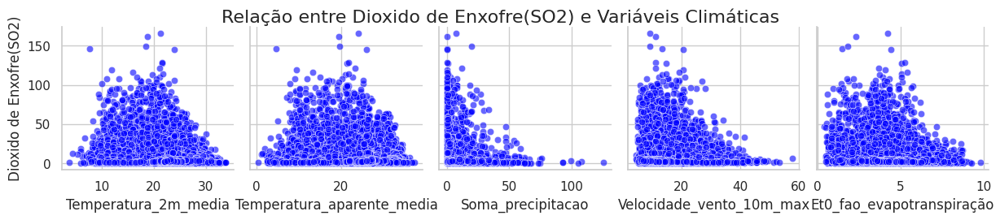


Calculando 'r' de Pearson (Correlação) para Ozônio(O3):
  > Correlação com Temperatura_2m_media:
    r =  0.205   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Temperatura_aparente_media:
    r =  0.150   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Soma_precipitacao:
    r = -0.098   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Velocidade_vento_10m_max:
    r =  0.181   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)
  > Correlação com Et0_fao_evapotranspiração:
    r =  0.312   (p-valor:  0.0000)
    (Esta correlação é estatisticamente significativa)

Gerando gráficos de dispersão (pairplot)...


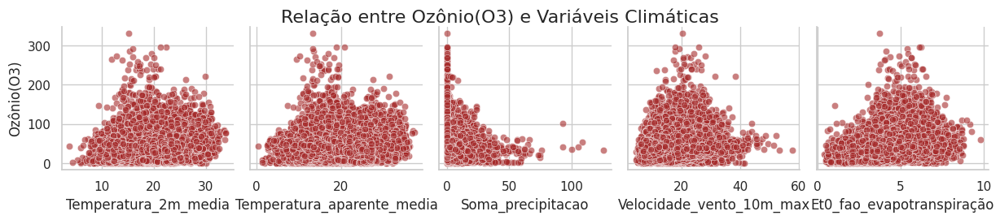

In [34]:

colunas_clima = [
    'Temperatura_2m_media', 'Temperatura_aparente_media', 'Soma_precipitacao',
    'Velocidade_vento_10m_max', 'Et0_fao_evapotranspiração'
]
cores_dos_gases = {
    'PM10': 'purple',
    'PM2_5': 'red',
    'Monóxido de Carbono (CO)': 'green',
    'Dióxido de Nitrogênio (NO2)': 'orange',
    'Dioxido de Enxofre(SO2)': 'blue',
    'Ozônio(O3)': 'brown'
}

colunas_gases = list(cores_dos_gases.keys())

for gas in colunas_gases:

    cor_atual = cores_dos_gases[gas]

    colunas_especificas = colunas_clima.copy()
    colunas_especificas.append(gas)

    df_corr_scatter = df_geral[colunas_especificas].copy()
    df_corr_scatter = df_corr_scatter.dropna()

    if df_corr_scatter.empty:
        print(f"Atenção: Não há dados válidos para {gas}. Pulando...")
        continue

    print(f"\nCalculando 'r' de Pearson (Correlação) para {gas}:")

    for clima_var in colunas_clima:
        # Pegamos as duas colunas que queremos comparar
        coluna_gas = df_corr_scatter[gas]
        coluna_clima = df_corr_scatter[clima_var]

        # Calculamos o 'r' e o 'p-valor'
        # Usamos try/except caso haja algum problema (ex: dados sem variação)
        try:
            r_valor, p_valor = st.pearsonr(coluna_gas, coluna_clima)

            print(f"  > Correlação com {clima_var}:")
            print(f"    r = {r_valor: .3f}   (p-valor: {p_valor: .4f})")

            # Uma pequena ajuda na interpretação do p-valor
            if p_valor < 0.05:
                print("    (Esta correlação é estatisticamente significativa)")
            else:
                print("    (Esta correlação pode ter ocorrido ao acaso)")

        except ValueError as e:
            print(f"  > Não foi possível calcular a correlação com {clima_var}: {e}")

    # --- 3. PLOTAGEM (Seu código) ---
    print("\nGerando gráficos de dispersão (pairplot)...")
    sns.pairplot(
        df_corr_scatter,
        y_vars = [gas],
        x_vars = colunas_clima,
        plot_kws={'color': cor_atual, 'alpha': 0.6}
    )
    plt.suptitle(f'Relação entre {gas} e Variáveis Climáticas', y=1.05, fontsize=16)
    plt.show()

O cálculo do coeficiente de correlação 'r' de Pearson resultou em valores consistentemente baixos, para a maioria dos pares de variáveis. Isso indica que **não existe uma relação linear forte** entre uma variável climática **sozinha** e um poluente.

Essa conclusão é visualmente confirmada pelos gráficos de dispersão (scatter plots), que, em sua maioria, não apresentam uma tendência linear clara, assemelhando-se a nuvens de pontos espalhados. Na prática, isso significa que uma variável climática isolada tem um **poder preditivo muito fraco** e, portanto, um modelo de Regressão Linear Simples não seria eficaz para estimar os níveis de poluição.

Apesar das correlações fracas, nota-se que os p-valores associados a esses testes de correlação foram, em quase todos os casos, 0.0. Este resultado não é um erro, mas sim uma consequência direta do **enorme tamanho da nossa amostra.**

Um p-valor tão baixo não mede a força da relação, mas sim a nossa certeza sobre ela. Ele nos diz que, com tantos dados, temos um "microscópio estatístico" poderoso o suficiente para detectar até as menores correlações com extrema confiança, concluindo que elas não são exatamente zero e sim um efeito real (embora minúsculo).



###**Observação:**
Uma notável exceção foi encontrada na relação entre a 'Soma_precipitacao' e o 'Dióxido de Nitrogênio (NO2)'. Diferente das outras correlações, esta foi a única que apresentou um p-valor alto (p > 0.05). Isso indica que a fraca correlação 'r' observada para este par específico é estatisticamente não-significante, e deve ser tratada como se fosse zero, pois muito provavelmente é apenas um ruído aleatório na amostra.

###**Conclusão:**
Nossos dados mostram que estamos estatisticamente certos (p $\approx$ 0.0) de que as relações lineares são fracas (r $\approx$ 0.0). Para a finalidade de previsão, o que importa é a força da relação. Como o 'r' é baixo, concluímos que a poluição do ar é um fenômeno complexo demais para ser explicada por uma única variável climática.

Essa constatação justifica a necessidade de avançar para modelos mais robustos, como a **Regressão Linear Múltipla**, onde investigaremos se uma combinação de variáveis climáticas possui um poder preditivo maior.

##**Correlações entre os gases:**

Dado que temos dados de diferentes gases, é importante descobrir se esses gases estão, de alguma maneira, relacionados. Os resultados, se forem significantes, podem ser releventes para montar o modelo de regressão.

In [35]:
# Definir os Indicadores de Interesse
INDICADORES_PARA_CORRELACAO = ['PM10', 'PM2_5', 'Monóxido de Carbono (CO)', 'Dióxido de Nitrogênio (NO2)', 'Dioxido de Enxofre(SO2)', 'Ozônio(O3)']

df_corr = dados_clima.copy()

# Remove colunas que não existem nos dados
colunas_presentes = [col for col in INDICADORES_PARA_CORRELACAO if col in df_corr.columns]
df_corr = df_corr[colunas_presentes]


A seguir, é possível fazer uma análise visual (item a item) dos gases. Tais resultados mostram claramente que exitem relações lineares entre as variáveis. Para confirmar isso, logo em seguida é possível visualizar os valores reais das correlações, medidas utilizando o coeficiente **"r" de Pearson.**

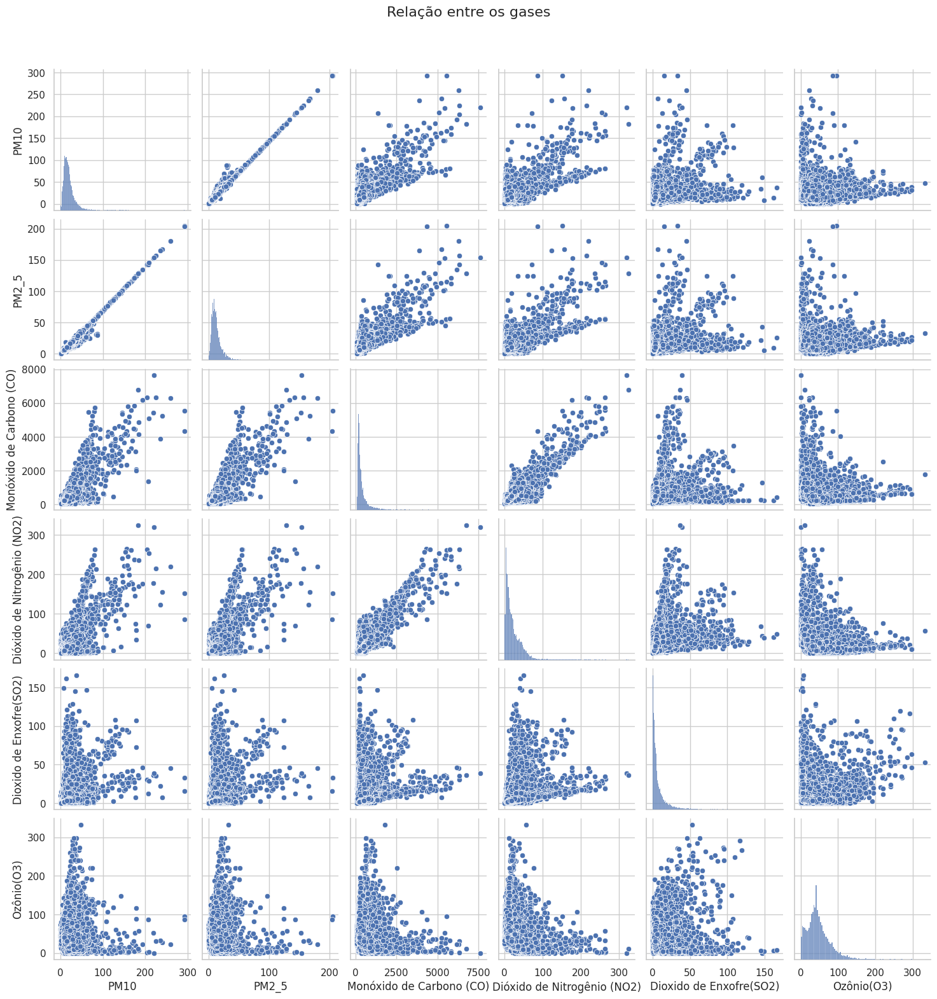

In [36]:
sns.pairplot(
        df_corr
    )
plt.suptitle(f'Relação entre os gases', y=1.05, fontsize=16)
plt.show()

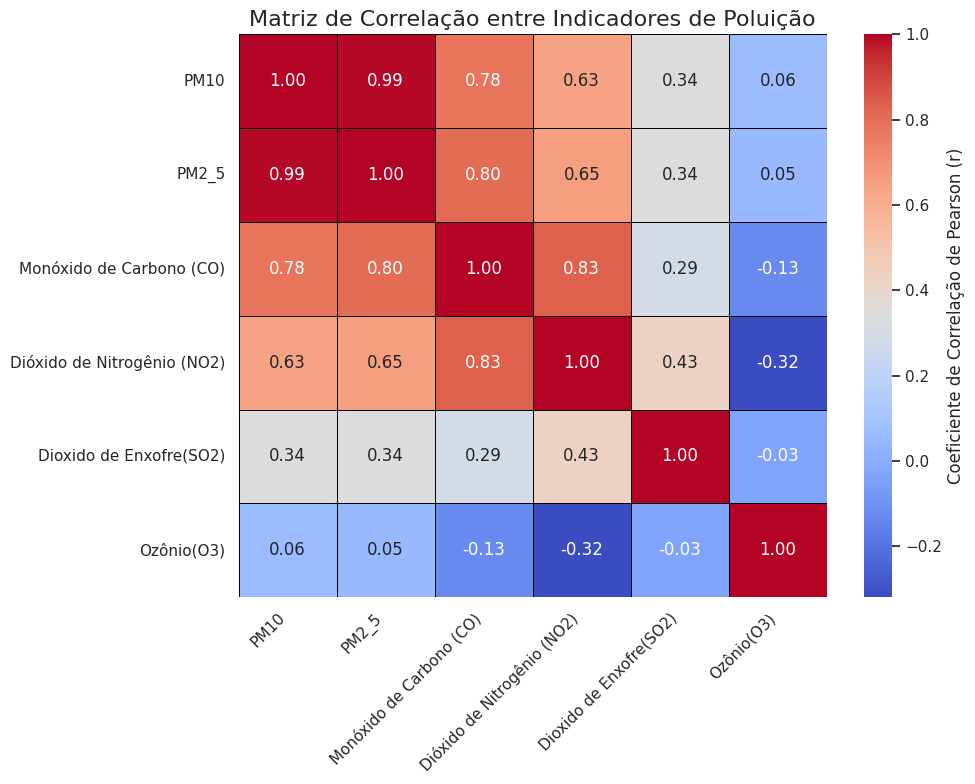


📈 Pares de Variáveis com Correlação Forte (|r| > 0.7):
  PM2_5 vs PM10: 0.99
  Dióxido de Nitrogênio (NO2) vs Monóxido de Carbono (CO): 0.83
  Monóxido de Carbono (CO) vs PM2_5: 0.80
  Monóxido de Carbono (CO) vs PM10: 0.78


In [37]:

# Calcular a Matriz de Correlação
matriz_correlacao = df_corr.corr(numeric_only=True)

# print(matriz_correlacao) # Descomente para ver a tabela de números

plt.figure(figsize=(10, 8))

sns.heatmap(
    matriz_correlacao,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=.5,
    linecolor='black',
    cbar_kws={'label': 'Coeficiente de Correlação de Pearson (r)'} # Rótulo da barra de cor
)

plt.title('Matriz de Correlação entre Indicadores de Poluição', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()


matriz_upper = matriz_correlacao.where(np.triu(np.ones(matriz_correlacao.shape), k=1).astype(bool))
pares_altamente_correlacionados = matriz_upper.unstack().sort_values(ascending=False).dropna()

print("\n📈 Pares de Variáveis com Correlação Forte (|r| > 0.7):")
for index, valor in pares_altamente_correlacionados.items():
    if abs(valor) >= 0.7:
        print(f"  {index[0]} vs {index[1]}: {valor:.2f}")

###**Conclusões:**
Estes resultados trazem um insight fundamental para a análise. A investigação anterior demonstrou a ausência de relações lineares simples entre as variáveis climáticas e os gases, indicando que uma variável climática, isoladamente, possui baixo poder preditivo sobre os níveis de poluição.

Em contrapartida, a presente análise revela que, diferentemente do cenário clima-poluente, existem fortes correlações lineares entre os próprios gases. Esta descoberta é crucial, pois sugere que os poluentes não variam de forma independente, mas sim em conjunto, provavelmente por serem emitidos das mesmas fontes ou sofrerem reações químicas similares na atmosfera.

#**Regressão:**

Após a análise exploratória e de correlação, ficou claro que a relação entre as variáveis climáticas e os níveis de poluição do ar (especificamente o PM2.5) é complexa. As correlações lineares simples se mostraram fracas (r ≈  0.0), apesar de estatisticamente significantes devido ao grande volume de dados (p-valor ≈  0.0). Isso reforçou a hipótese de que a poluição não pode ser explicada adequadamente por uma única variável climática, justificando a necessidade de modelos mais robustos como a Regressão Linear Múltipla.

**1- É possível desenvolver um modelo de regressão que preveja os níveis de PM2.5 para cidades da América Latina, usando dados meteorológicos e históricos como entrada?**

**Seleção de features e variáveis preditoras:**

1. **Lag Temporal (`PM2_5_lag`):** Criamos uma nova coluna que representa o nível de PM2.5 do dia anterior para cada cidade. A poluição tende a ter autocorrelação (o nível de hoje influencia o de amanhã), tornando esta uma *feature* potencialmente muito preditiva.
2. **Features Temporais (`Mês_Nome`, `Dia_Semana_Nome`):** Selecionamos o mês e o dia da semana. Essas variáveis podem capturar padrões sazonais e semanais que afetam a poluição.
3.  **Seleção de Variáveis:** Definimos explicitamente nossa variável alvo (PM2.5) e a lista de variáveis preditoras, que incluem as *features* criadas e todas as variáveis meteorológicas originais.

In [38]:
# Etapa 1 - Preparação do modelo

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression

df_modelo = df_geral.copy()

# Definir os dados para previsões (históricos e metereológicos)
# Cria lag de 1 dia para PM2.5, agrupado por cidade
df_modelo['Data'] = pd.to_datetime(df_modelo['Data'])
df_modelo['Data'] = df_modelo['Data'].dt.tz_localize(None)
df_modelo = df_modelo.sort_values(by=['Cidade_x', 'Data'])
df_modelo['PM2_5_lag'] = df_modelo.groupby('Cidade_x')['PM2_5'].shift(1)
# Separa as variáveis metereológicas
colunas_meteorologicas = [
    'Temperatura_2m_media', 'Temperatura_aparente_media', 'Soma_precipitacao',
    'Velocidade_vento_10m_max', 'Et0_fao_evapotranspiração'
]
preditores = colunas_meteorologicas + ['PM2_5_lag', 'Mês_Nome', 'Dia_Semana_Nome', 'Cidade_x'] # Variáveis meteorológicas + lag + temporais + cidade
alvo = 'PM2_5'
# Mantém apenas as colunas necessárias para regressão
colunas_finais = [alvo] + preditores + ['Data'] + ['PM10', 'Monóxido de Carbono (CO)', 'Dióxido de Nitrogênio (NO2)', 'Dioxido de Enxofre(SO2)', 'Ozônio(O3)']
df_modelo = df_modelo[colunas_finais].copy()
df_modelo = df_modelo.dropna(subset=[alvo] + preditores)

print(f"Total de amostras prontas para modelagem: {len(df_modelo)}")
df_modelo.head()

Total de amostras prontas para modelagem: 12500


,PM2_5,Temperatura_2m_media,Temperatura_aparente_media,Soma_precipitacao,Velocidade_vento_10m_max,Et0_fao_evapotranspiração,PM2_5_lag,Mês_Nome,Dia_Semana_Nome,Cidade_x,Data,PM10,Monóxido de Carbono (CO),Dióxido de Nitrogênio (NO2),Dioxido de Enxofre(SO2),Ozônio(O3)
10119,1.4,16.147417,14.802985,0.0,17.339897,2.918878,17.7,Agosto,Sexta-feira,Asuncion,2022-08-05,2.0,226.0,2.05,0.35,51.0
10120,5.6,15.928666,15.270274,52.4,15.876775,1.124936,1.4,Agosto,Sábado,Asuncion,2022-08-06,8.2,212.0,3.60,0.45,43.0
10121,27.2,16.147419,15.720817,9.6,16.039202,1.569563,5.6,Agosto,Domingo,Asuncion,2022-08-07,38.9,441.0,7.25,0.25,39.0
10122,10.2,16.301582,15.176742,0.0,19.914217,2.237444,27.2,Agosto,Segunda-feira,Asuncion,2022-08-08,14.6,279.0,3.50,0.40,43.0
10123,6.3,14.397415,11.546158,0.4,29.568253,1.893329,10.2,Agosto,Terça-feira,Asuncion,2022-08-09,9.4,179.0,2.00,0.40,48.0


**Passos Realizados:**

1.  **Definição de Preditores (X) e Alvo (y):**
    * Separamos o DataFrame em `X` (contendo todas as colunas preditoras: lags, variáveis temporais, cidade e meteorologia) e `y` (a coluna alvo `PM2_5`).

2.  **Pré-processamento das Variáveis:**
    * A Regressão Linear exige que as variáveis de entrada estejam em um formato adequado. Usamos o `ColumnTransformer` do `sklearn` para aplicar tratamentos distintos a diferentes tipos de colunas:
        * **Variáveis Numéricas** (`PM2_5_lag`, todas as meteorológicas): Aplicamos `StandardScaler()` para padronizá-las. Isso é importante para que variáveis com escalas diferentes (ex: temperatura vs. precipitação) tenham pesos comparáveis no modelo.
        * **Variáveis Categóricas** (`Cidade_x`, `Mês_Nome`, `Dia_Semana_Nome`): Aplicamos `OneHotEncoder()` para transformá-las em variáveis *dummy* (colunas binárias para cada categoria). Isso permite que o modelo linear capture o efeito específico de cada cidade, mês ou dia da semana.

3.  **Divisão Treino/Teste:**
    * Dividimos os dados em conjuntos de treino (80%) e teste (20%) usando `train_test_split`. O modelo terá seus coeficientes calculados usando apenas os dados de treino. Sua performance real será avaliada nos dados de teste, simulando como ele se comportaria com novos dados.

4.  **Criação e Treinamento do Pipeline:**
    * Utilizamos um `Pipeline` do `sklearn` para encadear o pré-processamento (`preprocessor`) e o modelo (`LinearRegression`).
    * O método `.fit(X_train, y_train)` treina todo o pipeline: ele aplica o pré-processamento aos dados de treino e, em seguida, ajusta o modelo de Regressão Linear Múltipla a esses dados processados para encontrar os melhores coeficientes.

5.  **Previsão e Avaliação:**
    * Usamos o pipeline treinado para fazer previsões (`.predict()`) no conjunto de teste (`X_test`).
    * Calculamos duas métricas principais para avaliar o desempenho:
        * **MSE (Erro Quadrático Médio):** Mede a média dos erros ao quadrado. Quanto menor, melhor.
        * **R² (R-quadrado):** Indica a proporção da variância do `PM2_5` que o modelo consegue explicar. Varia de 0 a 1. Quanto maior, melhor.

6.  **Intervalo de Confiança:**
    * Para avaliar a robustez das nossas métricas (MSE e R²), aplicamos a técnica de Bootstrap nos resultados do conjunto de teste.
    * Reamostramos pares de valores (real, previsto) 1000 vezes com reposição.
    * Calculamos o MSE e o R² para cada uma dessas 1000 amostras bootstrap.
    * Usamos a média e o desvio padrão dessas 1000 métricas para construir um Intervalo de Confiança de 95%. Isso nos dá uma faixa mais confiável para o desempenho real do modelo.

7.  **Visualização:**
    * Geramos um gráfico de dispersão comparando os Valores Reais de PM2.5 no eixo X com os Valores Previstos pelo modelo no eixo Y. Adicionamos uma linha diagonal (`y=x`) que representa uma referência. Isso permite avaliar visualmente a qualidade do ajuste e identificar possíveis padrões nos erros do modelo.

--------------------------------------------------
Resultados Regressão Linear Múltipla
R² Teste: 0.6519
R² Médio: 0.6522
Erro Padrão do R²: 0.0345
IC R² (95%): [0.5845, 0.7198]
MSE Teste: 48.9079
MSE Médio: 48.8729
Erro Padrão do MSE: 8.0081
IC MSE (95%): [33.1772, 64.5687]
--------------------------------------------------


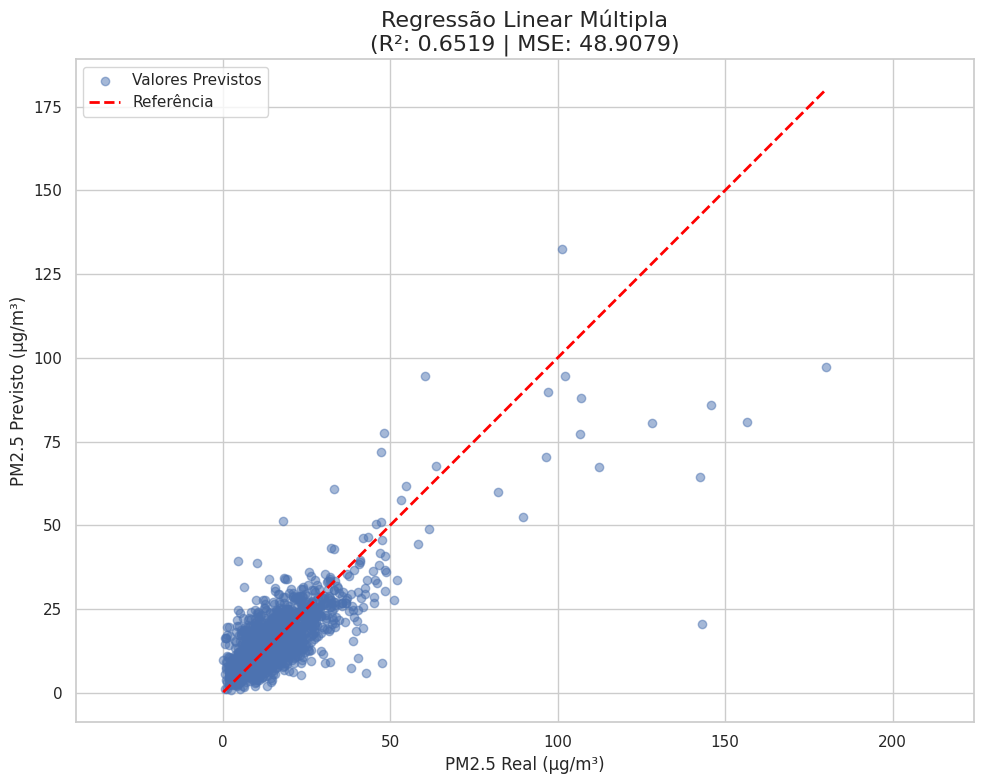

In [39]:
# Etapa 2 - Regressão Múltipla

# Definir X (preditores) e y (alvo)
X = df_modelo[preditores]
y = df_modelo[alvo]

# Padronização e one-hot
# Divide variáveis entre categóricas e numéricas
categoricas = ['Cidade_x', 'Mês_Nome', 'Dia_Semana_Nome']
numericas = [col for col in X.columns if col not in categoricas]
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numericas), # Padroniza numéricas
        ('cat', OneHotEncoder(handle_unknown='ignore'), categoricas) # One-Hot categóricas
    ],
    remainder='passthrough' # Mantém as colunas não especificadas
)

# Divisão treino/teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Treinando o modelo
pipeline_rm = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', LinearRegression())
])
pipeline_rm.fit(X_train, y_train)
y_pred_rm = pipeline_rm.predict(X_test)
mse_rm = mean_squared_error(y_test, y_pred_rm)
r2_rm = r2_score(y_test, y_pred_rm)

# IC 95% para o R2 e MSE
n = len(y_test)
indices = np.arange(n)
y_true = y_test.to_numpy()
y_pred = y_pred_rm
resultados_mse = []
resultados_r2 = []
for i in range(1000):
  resample_indices = np.random.choice(indices, size=n, replace=True)
  y_true_resample = y_true[resample_indices]
  y_pred_resample = y_pred[resample_indices]

  mse_resample = mean_squared_error(y_true_resample, y_pred_resample)
  r2_resample = r2_score(y_true_resample, y_pred_resample)

  resultados_r2.append(r2_resample)
  resultados_mse.append(mse_resample)

mean_r2 = np.mean(resultados_r2)
std_r2 = np.std(resultados_r2)
LI_r2 = mean_r2 - 1.96 * std_r2
LS_r2 = mean_r2 + 1.96 * std_r2
mean_mse = np.mean(resultados_mse)
std_mse = np.std(resultados_mse)
LI_mse = mean_mse - 1.96 * std_mse
LS_mse = mean_mse + 1.96 * std_mse

print("-"*50)
print("Resultados Regressão Linear Múltipla")
print(f"R² Teste: {r2_rm:.4f}") # R2 original no teste
print(f"R² Médio: {mean_r2:.4f}") # Média do bootstrap
print(f"Erro Padrão do R²: {std_r2:.4f}") # STD do bootstrap
print(f"IC R² (95%): [{LI_r2:.4f}, {LS_r2:.4f}]")
print(f"MSE Teste: {mse_rm:.4f}") # MSE original no teste
print(f"MSE Médio: {mean_mse:.4f}") # Média do bootstrap
print(f"Erro Padrão do MSE: {std_mse:.4f}") # STD do bootstrap
print(f"IC MSE (95%): [{LI_mse:.4f}, {LS_mse:.4f}]")
print("-"*50)

# Gráfico previsto x real
plt.figure(figsize=(10, 8))
plt.scatter(y_test, y_pred, alpha=0.5, label='Valores Previstos')
max_val_rm = max(y_test.max(), y_pred_rm.max())
min_val_rm = min(y_test.min(), y_pred_rm.min())
plt.plot([min_val_rm, max_val_rm], [min_val_rm, max_val_rm], color='red', linestyle='--', linewidth=2, label='Referência')
plt.title(f'Regressão Linear Múltipla\n(R²: {r2_rm:.4f} | MSE: {mse_rm:.4f})', fontsize=16)
plt.xlabel('PM2.5 Real (µg/m³)', fontsize=12)
plt.ylabel('PM2.5 Previsto (µg/m³)', fontsize=12)
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.tight_layout()
plt.show()

Os resultados obtidos com o modelo de Regressão Linear Múltipla, tanto as métricas numéricas quanto a visualização gráfica, nos fornecem uma visão clara sobre sua capacidade preditiva para os níveis de PM2.5.

* **R² (R-quadrado):** O valor de R² no conjunto de teste foi de 0.6519. Isso significa que o modelo linear consegue explicar aproximadamente 65.2% da variabilidade nos níveis de PM2.5 utilizando os preditores selecionados (lags, variáveis meteorológicas, cidade, mês e dia da semana). É um resultado indicativo de que as variáveis escolhidas têm relevância, mas também aponta que cerca de 35% da variação não é capturada pelo modelo linear, sugerindo a presença de relações não-lineares ou a influência de outros fatores não incluídos. O Intervalo de Confiança de 95% para o R², calculado via bootstrap, reforça que o modelo tem um poder explicativo real e estatisticamente significante, embora com uma margem considerável de incerteza.

* **MSE (Erro Quadrático Médio):** O MSE no conjunto de teste foi de 48.9079. Para uma interpretação mais intuitiva, podemos usar a raiz quadrada (RMSE), que seria $\sqrt{48.9079} \approx 6.99$ µg/m³. Isso indica que, em média, as previsões do modelo de regressão linear erraram por cerca de 7 µg/m³. O Intervalo de Confiança de 95% para o MSE mostra uma variabilidade considerável no erro esperado do modelo, indicando que sua precisão pode flutuar bastante dependendo dos dados.

O gráfico de dispersão complementa as métricas:

1.  **Tendência Geral:** Os pontos azuis seguem a direção geral da linha vermelha tracejada, o que é consistente com o R² de 65.2%. Isso confirma visualmente que o modelo captura a relação positiva entre os valores reais e previstos.
2.  **Dispersão:** A nuvem de pontos está visivelmente espalhada ao redor da linha de referência. Essa dispersão é a representação visual do MSE (48.9) e do RMSE (~7 µg/m³), indicando que os erros individuais das previsões são frequentemente significativos.
3.  **Subestimação de Picos:** Um padrão claro emerge: para valores reais elevados de PM2.5 (no lado direito do gráfico), a grande maioria das previsões encontra-se abaixo da linha vermelha. Isso demonstra uma limitação importante do modelo linear: ele subestima consistentemente os dias de alta poluição. Ele não consegue capturar a magnitude desses eventos.
4.  **Não-Linearidade Sugerida:** A combinação da dispersão geral com a subestimação sistemática de valores altos fortemente sugere que a relação entre os preditores e o PM2.5 não é puramente linear. O modelo linear tenta ajustar a melhor reta possível, mas falha em modelar as complexidades e os extremos do fenômeno.

**Conclusão:**

A Regressão Linear Múltipla serve como um modelo base razoável, explicando 65% da variância do PM2.5 com um erro médio (RMSE) de aproximadamente 7 µg/m³. Os Intervalos de Confiança confirmam a significância estatística desses resultados. Contudo, as limitações são evidentes: a precisão individual é moderada (MSE alto) e o modelo falha notavelmente em prever picos de poluição. Esses achados justificam a investigação de modelos não-lineares, que podem oferecer maior flexibilidade para capturar as complexidades dos dados e, potencialmente, melhorar significativamente a precisão das previsões, especialmente em cenários de alta poluição.

**2- Quais variáveis meteorológicas (temperatura, velocidade do vento, pressão atmosférica) são os preditores mais importantes para a qualidade do ar, e essa importância varia entre as diferentes regiões?**

Para responder a isso de forma clara e interpretável, utilizaremos os coeficientes da Regressão Linear Múltipla como medida de importância. A análise será feita por cidade para capturar as especificidades locais.

**Metodologia:**

1. Treinaremos um modelo de Regressão Linear Múltipla separado para cada cidade presente no nosso conjunto de dados. Cada um desses modelos regionais utilizará apenas as variáveis meteorológicas como preditores para explicar a variação do PM2.5 naquela cidade específica. Isso nos permite isolar o efeito do clima localmente.
2. Para cada cidade, extrairemos os coeficientes da regressão ajustada. O valor do coeficiente indica o quanto o PM2.5 (em µg/m³) muda, em média, para cada aumento de um desvio padrão na variável meteorológica correspondente, mantendo as outras variáveis constantes naquele modelo específico da cidade. O sinal (positivo ou negativo) indica a direção desse impacto.
3. Para cada cidade processada, geraremos um gráfico de barras horizontais mostrando os coeficientes obtidos. Isso permite uma análise visual rápida dos fatores climáticos mais impactantes (positiva ou negativamente) naquela localidade específica. Após processar todas as cidades, os coeficientes de todos os modelos regionais serão compilados em uma tabela única. Esta tabela terá as variáveis meteorológicas nas linhas e as cidades nas colunas, facilitando a comparação direta do impacto de uma mesma variável entre as diferentes capitais.

Os códigos a seguir implementam este processo, fornecendo tanto a visualização individual por cidade quanto a tabela para uma análise comparativa da variação regional na importância das variáveis meteorológicas.

Analisando as cidades: [' Asuncion', ' Bogota', ' Brasilia', ' Buenos Aires', ' Caracas', ' Guatemala City', ' Havana', ' Lima', ' Managua', ' Mexico City', ' Montevideo', ' Panama City', ' Port-au-Prince', ' Quito', ' San Jose', ' San Salvador', ' Santiago', ' Santo Domingo', ' Sucre', ' Tegucigalpa']

Treinando modelo para: Asuncion...


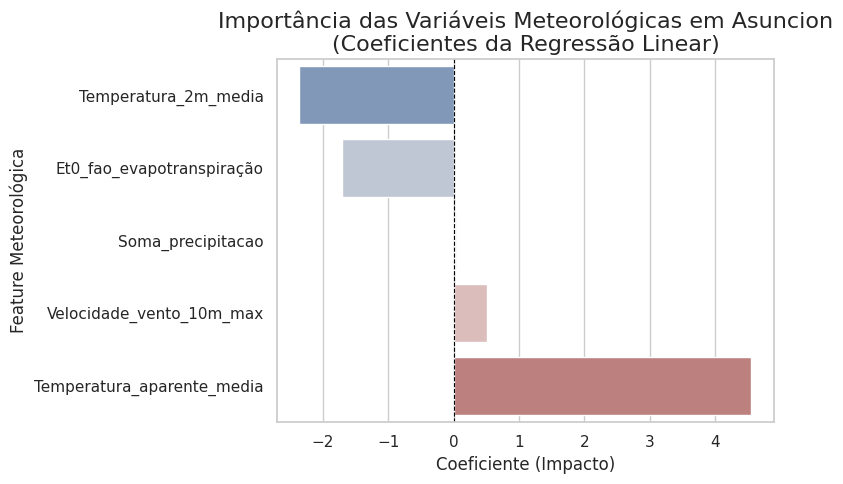


Treinando modelo para: Bogota...


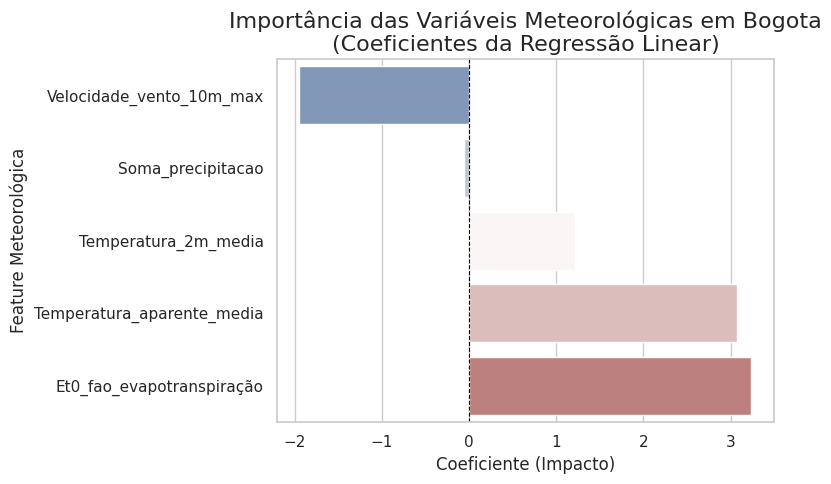


Treinando modelo para: Brasilia...


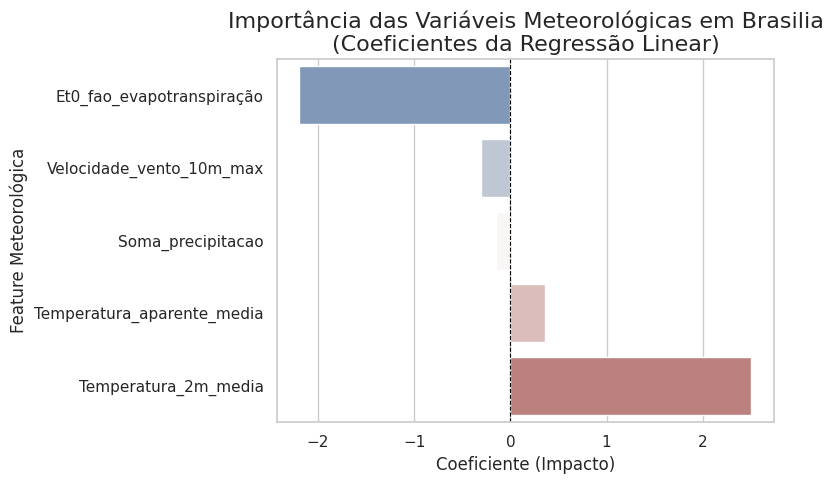


Treinando modelo para: Buenos Aires...


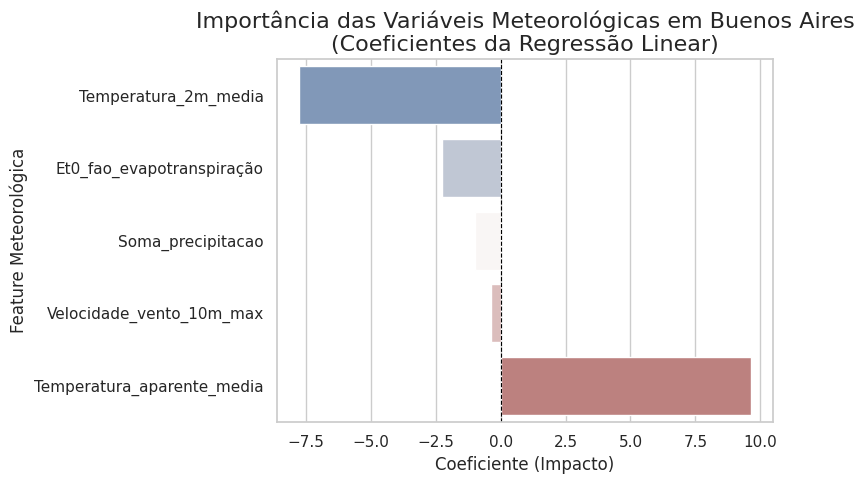


Treinando modelo para: Caracas...


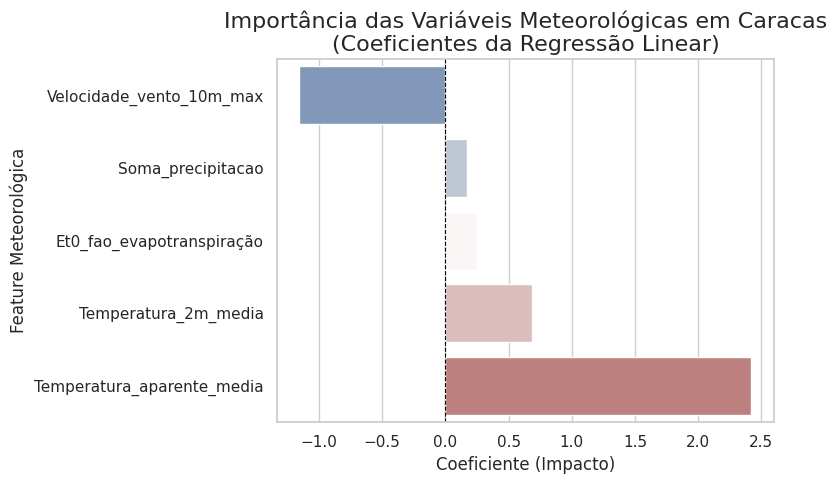


Treinando modelo para: Guatemala City...


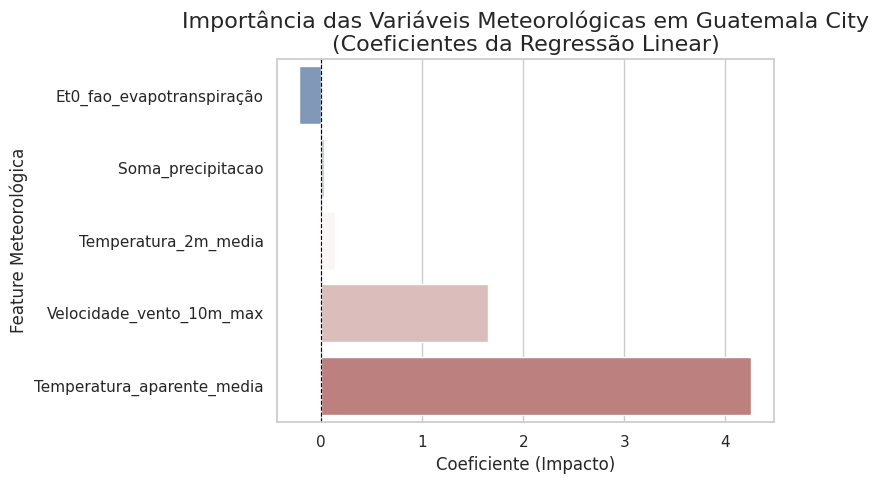


Treinando modelo para: Havana...


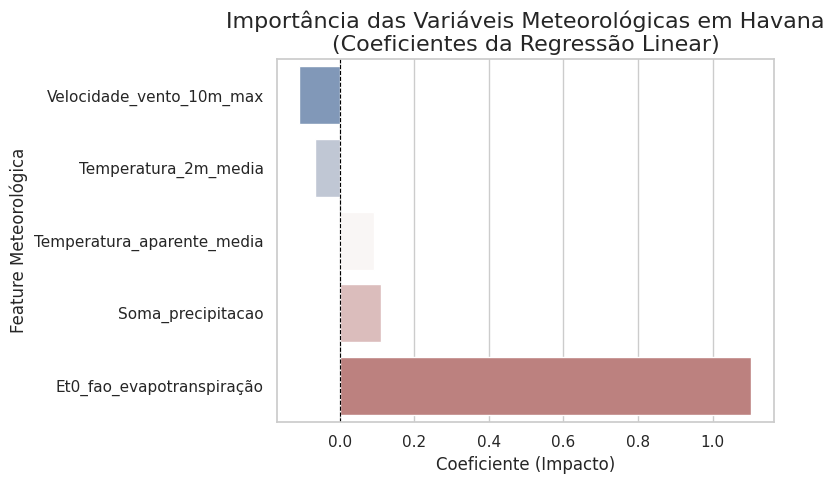


Treinando modelo para: Lima...


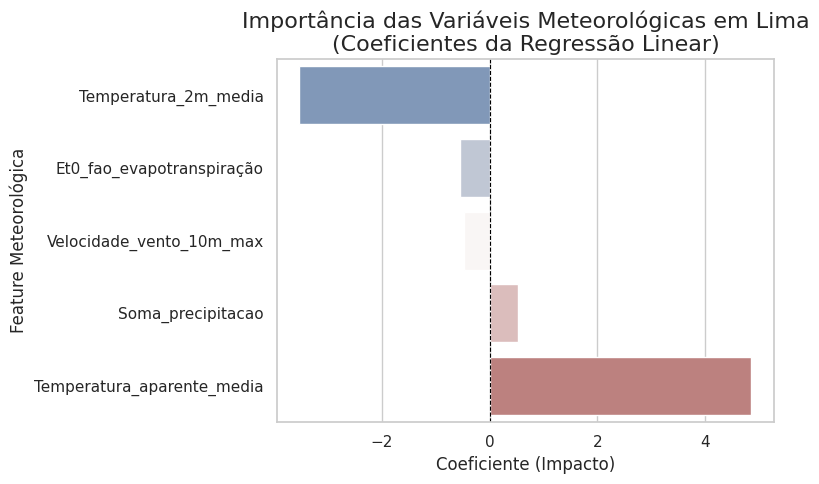


Treinando modelo para: Managua...


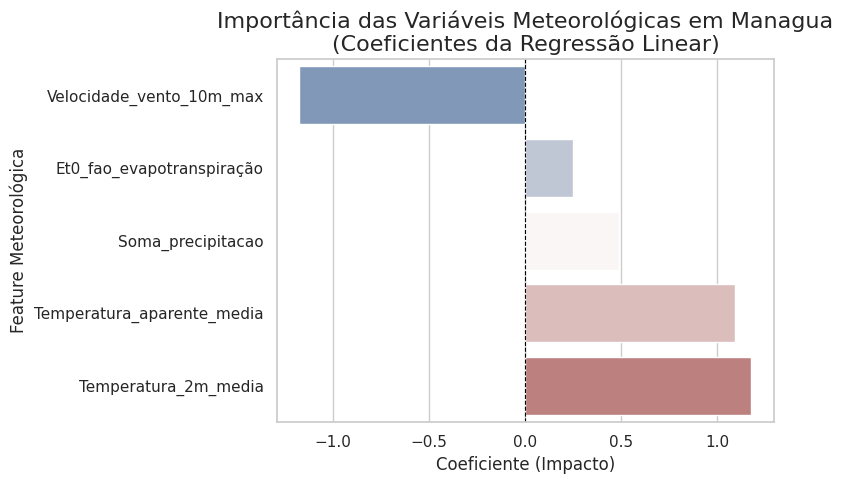


Treinando modelo para: Mexico City...


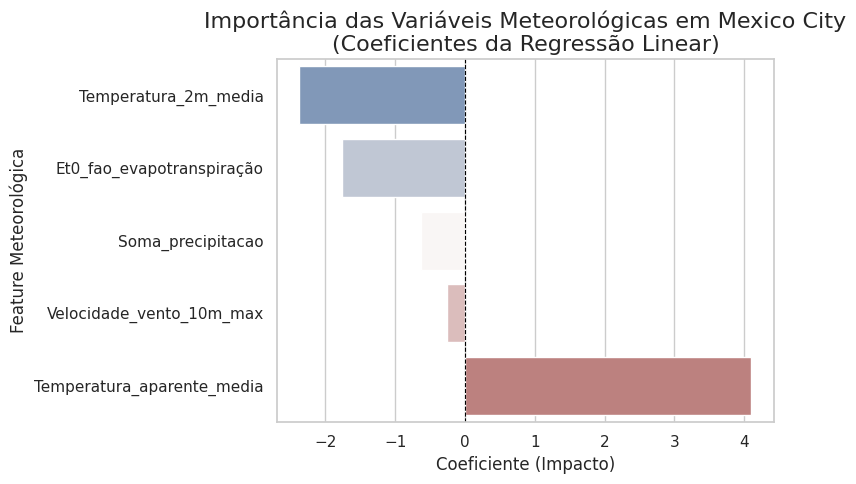


Treinando modelo para: Montevideo...


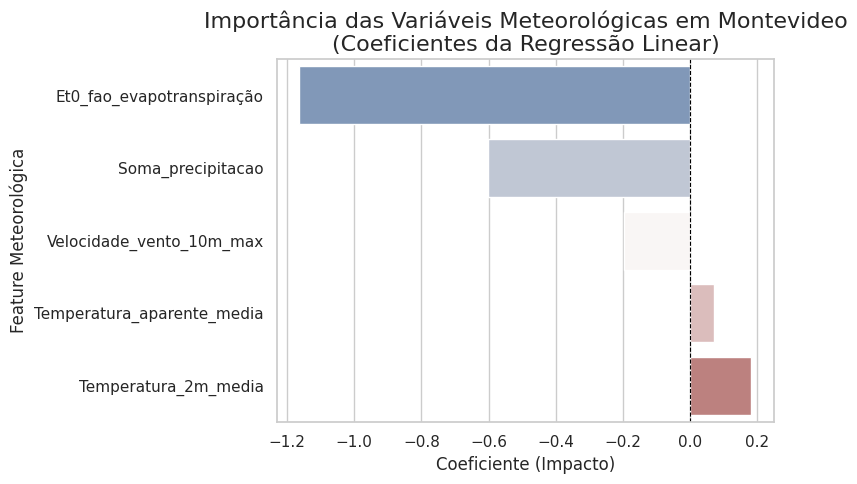


Treinando modelo para: Panama City...


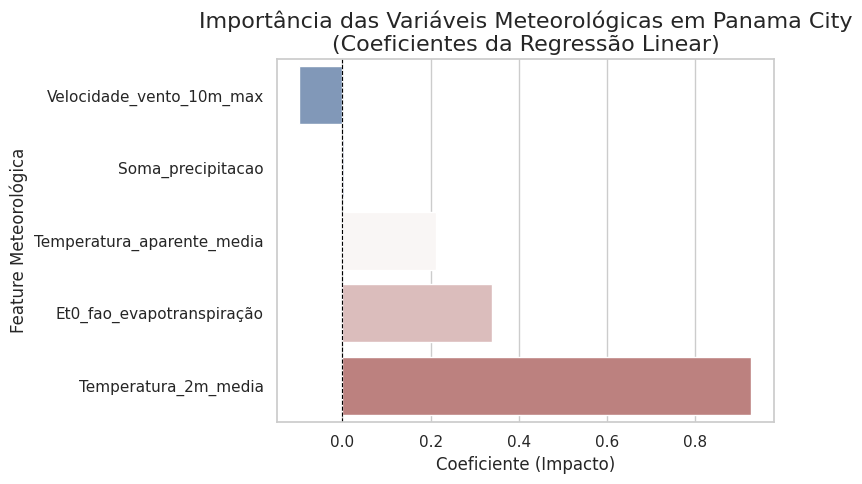


Treinando modelo para: Port-au-Prince...


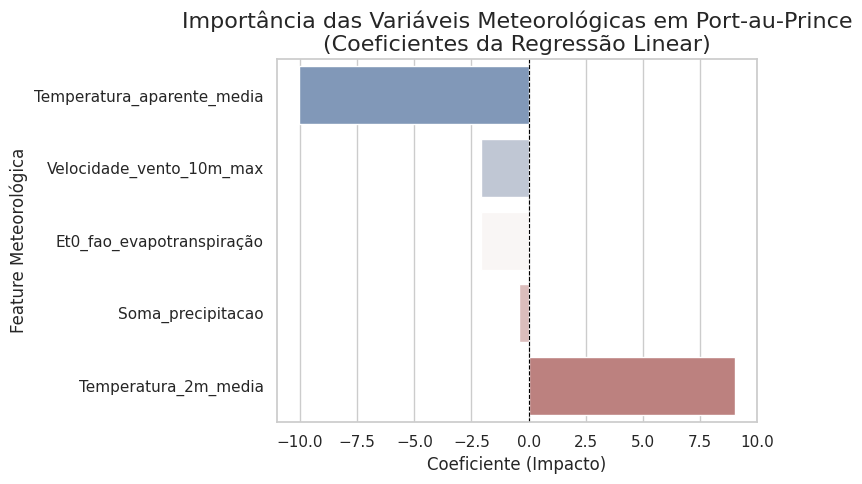


Treinando modelo para: Quito...


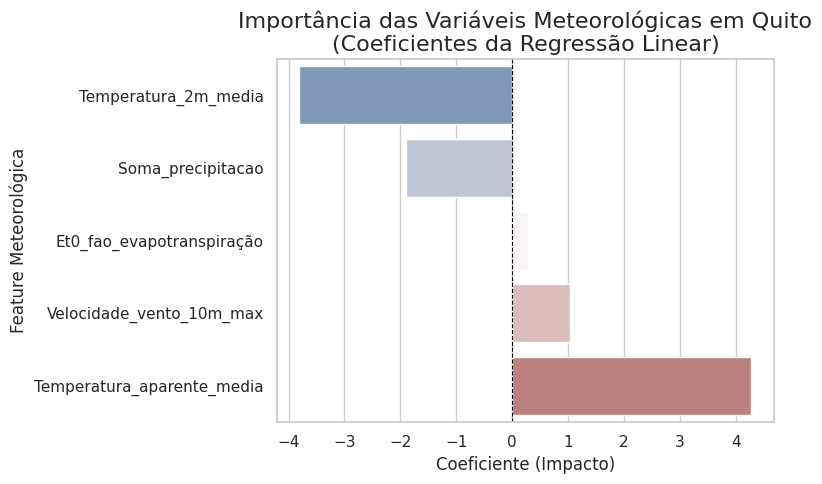


Treinando modelo para: San Jose...


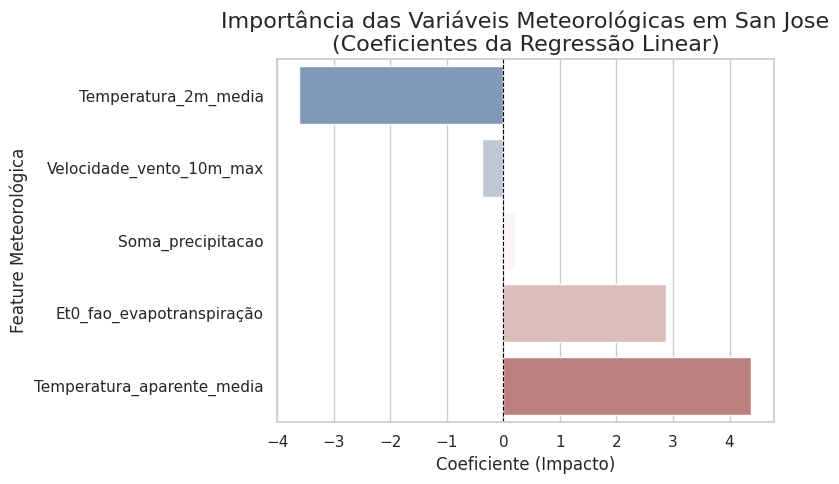


Treinando modelo para: San Salvador...


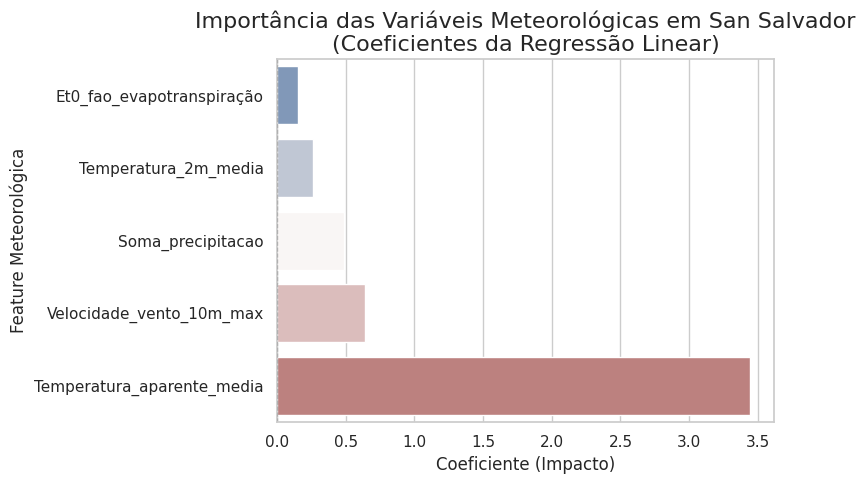


Treinando modelo para: Santiago...


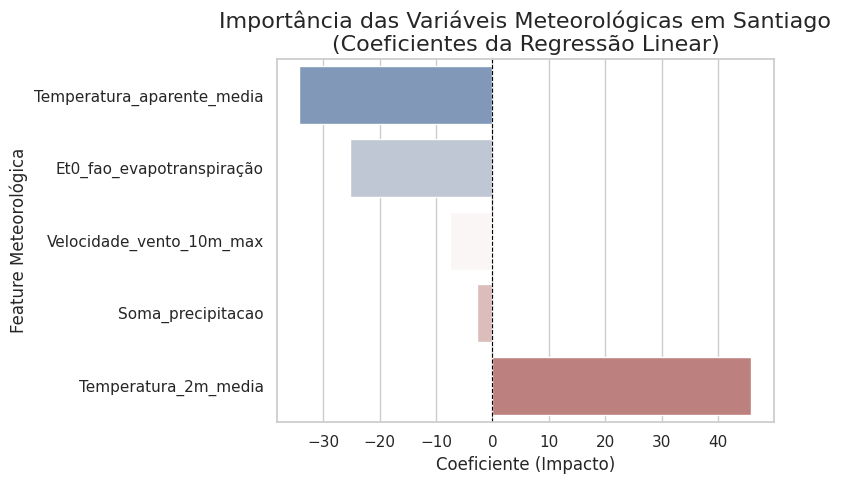


Treinando modelo para: Santo Domingo...


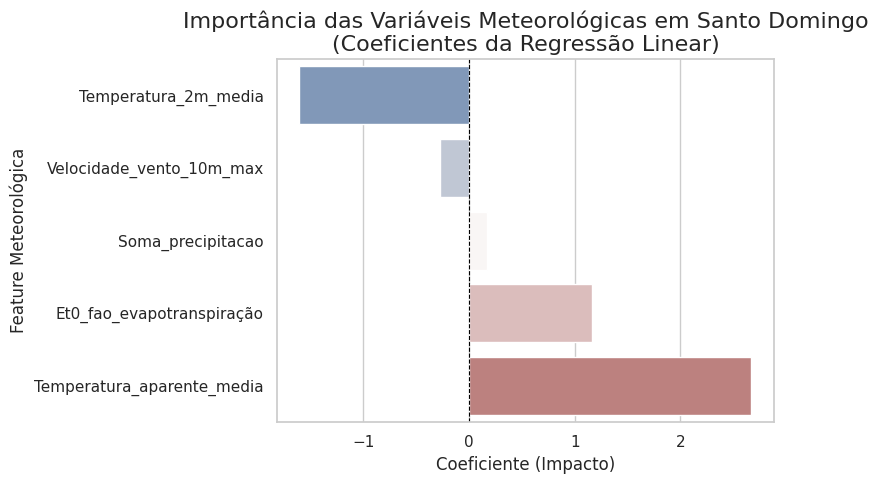


Treinando modelo para: Sucre...


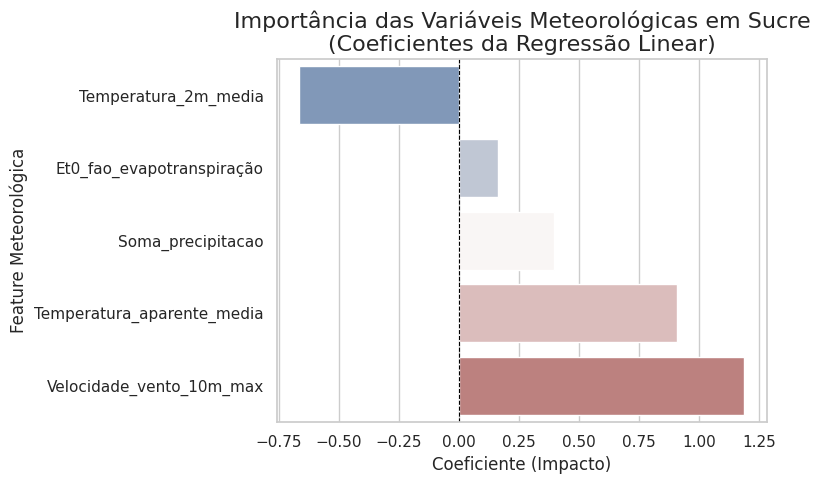


Treinando modelo para: Tegucigalpa...


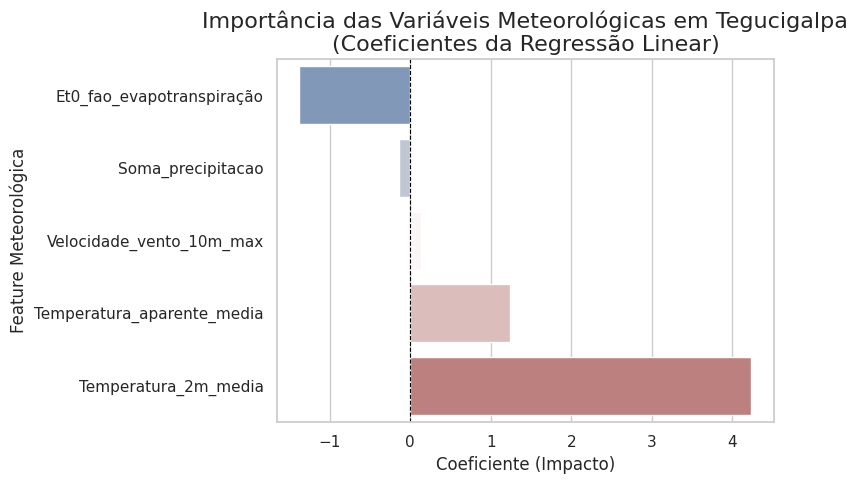

In [40]:
# Selecionar as cidades
cidades = df_modelo['Cidade_x'].unique().tolist()
print(f"Analisando as cidades: {cidades}")
resultados_cidades = []
# Loop para treinar um modelo e plotar gráfico para cada cidade
for cidade in cidades:
    print(f"\nTreinando modelo para:{cidade}...")
    df_cidade = df_modelo[df_modelo['Cidade_x'] == cidade].copy()
    # Definir X e y para esta cidade
    # Preditores: features meteorológicas
    y_cidade = df_cidade['PM2_5']
    X_cidade = df_cidade[colunas_meteorologicas]
    pipeline_cidade = Pipeline(steps=[
        ('scaler', StandardScaler()),
        ('model', LinearRegression())
    ])
    # Treinar o modelo
    try:
        pipeline_cidade.fit(X_cidade, y_cidade)
    except Exception as e:
        print(f"  Erro ao treinar modelo para {cidade}: {e}")
        continue
    # Obter coeficientes
    coefs = pipeline_cidade.named_steps['model'].coef_
    # Salvar em um DataFrame temporário para plotagem
    df_importancia = pd.DataFrame({
        'Coeficiente': coefs,
        'Feature': colunas_meteorologicas,
        'Cidade': cidade
    })
    resultados_cidades.append(df_importancia)
    # Ordenar os dados para plotagem
    df_plot = df_importancia.sort_values(by='Coeficiente')
    # Criar a figura e os eixos para esta cidade
    plt.figure(figsize=(8, 5))
    ax = sns.barplot(
        data=df_plot,
        x='Coeficiente',
        y='Feature',
        hue='Feature',
        legend=False,
        palette='vlag',
        orient='h'
    )
    # Adicionar títulos e labels
    ax.set_title(f'Importância das Variáveis Meteorológicas em{cidade}\n(Coeficientes da Regressão Linear)', fontsize=16)
    ax.set_xlabel('Coeficiente (Impacto)', fontsize=12)
    ax.set_ylabel('Feature Meteorológica', fontsize=12)
    ax.axvline(0, color='black', linestyle='--', linewidth=0.8)
    plt.tight_layout()
    plt.show()

In [41]:
# Tabela
# Combinar os DataFrames de todas as cidades em um só
df_importancia_combinada = pd.concat(resultados_cidades)
print("\nGerando Tabela Comparativa de Coeficientes...")
# Usar pivot_table para reformatar
tabela_comparativa = pd.pivot_table(
    df_importancia_combinada,
    values='Coeficiente', # Valores nas células
    index='Feature', # Linhas da tabela
    columns='Cidade' # Colunas da tabela
    )
tabela_comparativa = tabela_comparativa.round(3)
print("\nTabela Comparativa dos Coeficientes Padronizados por Cidade:")
print("(Valores indicam o impacto no PM2.5 para um aumento de 1 desvio padrão na variável)")
display(tabela_comparativa)
print("\n--- Geração da Tabela Concluída ---")


Gerando Tabela Comparativa de Coeficientes...

Tabela Comparativa dos Coeficientes Padronizados por Cidade:
(Valores indicam o impacto no PM2.5 para um aumento de 1 desvio padrão na variável)


Cidade,Asuncion,Bogota,Brasilia,Buenos Aires,Caracas,Guatemala City,Havana,Lima,Managua,Mexico City,Montevideo,Panama City,Port-au-Prince,Quito,San Jose,San Salvador,Santiago,Santo Domingo,Sucre,Tegucigalpa
Feature,,,,,,,,,,,,,,,,,,,,
Et0_fao_evapotranspiração,-1.715,3.239,-2.191,-2.239,0.248,-0.212,1.104,-0.549,0.250,-1.768,-1.163,0.338,-2.074,0.276,2.879,0.155,-25.252,1.167,0.162,-1.378
Soma_precipitacao,0.054,-0.060,-0.144,-0.984,0.168,0.028,0.110,0.527,0.490,-0.633,-0.603,0.004,-0.411,-1.896,0.204,0.486,-2.685,0.173,0.396,-0.141
Temperatura_2m_media,-2.359,1.216,2.504,-7.747,0.687,0.140,-0.068,-3.529,1.178,-2.371,0.182,0.927,9.049,-3.805,-3.608,0.264,45.872,-1.603,-0.666,4.240
Temperatura_aparente_media,4.553,3.069,0.364,9.627,2.421,4.256,0.090,4.861,1.090,4.101,0.071,0.212,-10.060,4.277,4.387,3.445,-34.192,2.671,0.910,1.244
Velocidade_vento_10m_max,0.504,-1.945,-0.309,-0.355,-1.155,1.650,-0.109,-0.468,-1.176,-0.257,-0.196,-0.097,-2.083,1.041,-0.377,0.642,-7.590,-0.272,1.189,0.134



--- Geração da Tabela Concluída ---


**Análise por Variável Meteorológica:**

* **Evapotranspiração (`Et0_fao_evapotranspiração`):** Esta variável mostra um comportamento inconsistente entre as cidades. Em Santiago (-25.252), ela tem um grande impacto negativo, sugerindo que condições que favorecem a evapotranspiração (como tempo seco e ensolarado) estão fortemente associadas a uma baixa na poluição. Impactos negativos moderados também são vistos em Brasília, Buenos Aires, Mexico City, Montevideo, Port-au-Prince e Tegucigalpa. Por outro lado, em Bogotá (+3.239) e San Jose (+2.879), a evapotranspiração parece aumentar a poluição. Em muitas outras cidades, o impacto é fraco. Essa grande variação torna difícil tirar uma conclusão geral sobre seu papel.

* **Precipitação (`Soma_precipitacao` ):** A chuva tende a ter um impacto negativo (limpeza do ar), sendo mais pronunciado em Santiago (-2.685), Quito (-1.896) e Buenos Aires (-0.984). No entanto, o efeito é fraco ou até ligeiramente positivo em várias cidades (Lima: +0.527, Managua: +0.490, San Salvador: +0.486, Sucre: +0.396). Isso pode estar relacionado a poucos dias de chuva nessas amostras, correlações espúrias, ou talvez chuvas fracas que não são suficientes para limpar o ar mas ocorrem em condições meteorológicas que também favorecem a poluição. De forma geral, a chuva parece ser um fator redutor, mas sua eficácia varia.

* **Temperatura Média (`Temperatura_2m_media`):** Esta variável apresenta a maior variação e os maiores coeficientes. O impacto é extremamente positivo em Santiago (+45.872) e Port-au-Prince (+9.049), sugerindo que o aumento da temperatura está fortemente ligado ao aumento da poluição nessas localidades. Contudo, o impacto é fortemente negativo em Buenos Aires (-7.747) e Lima (-3.529), e moderadamente negativo em Quito, San Jose e Asuncion. Em Brasília (+2.504), o impacto é positivo mas menos extremo. Isso demonstra que a relação "temperatura vs. poluição" é altamente dependente do contexto local.

* **Sensação Térmica Média (`Temperatura_aparente_media`):** Segue um padrão complexo, muitas vezes oposto ao da temperatura média na mesma cidade. Em Santiago (-34.192) e Port-au-Prince (-10.060), onde a temperatura média tinha forte impacto positivo, a sensação térmica tem forte impacto negativo. Por outro lado, em Buenos Aires (+9.627), onde a temperatura média tinha impacto negativo, a sensação térmica tem forte impacto positivo. Cidades como Asuncion, Bogotá, Guatemala City, Lima, Mexico City, Quito, San Jose, San Salvador e Santo Domingo mostram um impacto positivo moderado. Isso sugere que a combinação de temperatura com outros fatores (como umidade e vento, que influenciam a sensação térmica) tem uma relação complexa e não-linear com o PM2.5, que o modelo linear tenta capturar com coeficientes às vezes contraditórios entre as duas medidas de temperatura.

* **Vento (`Velocidade_vento_10m_max`):** O vento geralmente atua como um fator de dispersão (impacto negativo), sendo mais forte em Santiago (-7.590), Bogotá (-1.945), Port-au-Prince (-2.083), Caracas (-1.155) e Managua (-1.176). No entanto, em Guatemala City (+1.650), Sucre (+1.189) e Quito (+1.041), o coeficiente é positivo, indicando que ventos mais fortes estão associados a mais poluição. Isso pode ocorrer se o vento predominante nessas cidades trouxer poluição de fontes externas ou levantar poeira local. Em várias outras cidades, o impacto do vento é relativamente pequeno.

**Conclusão:**

A análise regional dos coeficientes da Regressão Linear Múltipla confirma que não existe um padrão meteorológico universal que explique a variação do PM2.5 nas capitais latino-americanas estudadas. A importância relativa e até a direção do impacto de fatores como vento, temperatura e precipitação variam substancialmente de uma cidade para outra. Isso confirma que as condições locais (geografia, clima geral, fontes de emissão) modulam fortemente a relação entre o clima diário e a qualidade do ar.

Portanto, para entender ou prever a poluição em uma cidade específica, é essencial considerar seu contexto local, seja através de modelos regionais ou incluindo a localização como uma variável categórica importante em um modelo global. A Regressão Linear Múltipla, ao fornecer coeficientes interpretáveis após a padronização, foi uma ferramenta útil para revelar essa heterogeneidade regional.